# Climate Features Analysis by Crop Season

This notebook analyzes climate features separately for **planting** and **harvesting** seasons using the `crop_season_flag` function.

For each crop (corn, soybean, wheat), we:
1. Filter data by planting and harvesting weeks
2. Plot histograms for each climate feature
3. Plot time series for each climate feature
4. Apply denoising filters to visualize trends

## Imports

In [2]:
import os
import sys
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.ndimage import uniform_filter1d, gaussian_filter1d
from scipy.signal import savgol_filter
from pathlib import Path

warnings.filterwarnings('ignore')

project_root = Path.cwd().parent
sys.path.insert(0, str(project_root))

from src.util.path import DATA_DIR
from src.dataset.climate.crop_seasonal import crop_season_flag

## Settings

In [3]:
# Plot settings
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette('husl')
FIGSIZE_HIST = (14, 5)
FIGSIZE_TS = (15, 5)
FIGSIZE_COMBINED = (15, 10)

# Convolution settings
WINDOW_SIZE = 30
GAUSSIAN_SIGMA = 5
SAVGOL_WINDOW = 51
SAVGOL_POLYORDER = 3

# Crops to analyze
CROPS = ['corn', 'soybean', 'wheat']

# Climate features to analyze
CLIMATE_FEATURES = ['TMAX', 'TMIN', 'AWND', 'SPI_1m', 'SPI_3m', 'SPI_7d']

# Display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

## Helper Functions

In [4]:
def plot_histogram_comparison(data_planting, data_harvesting, feature, crop, bins=50):
    """
    Plot side-by-side histograms for planting and harvesting seasons.
    """
    fig, axes = plt.subplots(1, 2, figsize=FIGSIZE_HIST)
    fig.suptitle(f'{crop.upper()} - {feature} Distribution by Season', fontsize=16, fontweight='bold')
    
    # Planting season
    clean_planting = data_planting.dropna()
    axes[0].hist(clean_planting, bins=bins, color='green', alpha=0.7, edgecolor='black')
    axes[0].set_xlabel(feature, fontsize=12)
    axes[0].set_ylabel('Frequency', fontsize=12)
    axes[0].set_title('Planting Season', fontsize=14, fontweight='bold')
    axes[0].grid(True, alpha=0.3)
    stats_text = f'Mean: {clean_planting.mean():.2f}\nStd: {clean_planting.std():.2f}\nCount: {len(clean_planting):,}'
    axes[0].text(0.98, 0.97, stats_text, transform=axes[0].transAxes, 
                 verticalalignment='top', horizontalalignment='right',
                 bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.5), fontsize=10)
    
    # Harvesting season
    clean_harvesting = data_harvesting.dropna()
    axes[1].hist(clean_harvesting, bins=bins, color='orange', alpha=0.7, edgecolor='black')
    axes[1].set_xlabel(feature, fontsize=12)
    axes[1].set_ylabel('Frequency', fontsize=12)
    axes[1].set_title('Harvesting Season', fontsize=14, fontweight='bold')
    axes[1].grid(True, alpha=0.3)
    stats_text = f'Mean: {clean_harvesting.mean():.2f}\nStd: {clean_harvesting.std():.2f}\nCount: {len(clean_harvesting):,}'
    axes[1].text(0.98, 0.97, stats_text, transform=axes[1].transAxes,
                 verticalalignment='top', horizontalalignment='right',
                 bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5), fontsize=10)
    
    plt.tight_layout()
    plt.show()

def plot_time_series_comparison(dates_planting, data_planting, dates_harvesting, data_harvesting, feature, crop):
    """
    Plot time series for planting and harvesting seasons on the same plot.
    """
    fig, ax = plt.subplots(figsize=FIGSIZE_TS)
    
    ax.plot(dates_planting, data_planting, color='green', alpha=0.6, linewidth=1.0, label='Planting Season')
    ax.plot(dates_harvesting, data_harvesting, color='orange', alpha=0.6, linewidth=1.0, label='Harvesting Season')
    
    ax.set_xlabel('Date', fontsize=12)
    ax.set_ylabel(feature, fontsize=12)
    ax.set_title(f'{crop.upper()} - {feature} Time Series by Season', fontsize=14, fontweight='bold')
    ax.legend(loc='best', fontsize=10)
    ax.grid(True, alpha=0.3)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

def plot_denoised_comparison(dates, data, feature, crop, season_name, color):
    """
    Plot original and denoised time series for a specific season.
    """
    mask = ~np.isnan(data)
    clean_data = data[mask]
    clean_dates = dates[mask]
    
    if len(clean_data) < SAVGOL_WINDOW:
        print(f"Not enough data points for denoising ({len(clean_data)} < {SAVGOL_WINDOW})")
        return
    
    moving_avg = uniform_filter1d(clean_data, size=WINDOW_SIZE, mode='nearest')
    gaussian = gaussian_filter1d(clean_data, sigma=GAUSSIAN_SIGMA, mode='nearest')
    savgol = savgol_filter(clean_data, window_length=SAVGOL_WINDOW, polyorder=SAVGOL_POLYORDER, mode='nearest')
    
    fig, axes = plt.subplots(2, 2, figsize=FIGSIZE_COMBINED)
    fig.suptitle(f'{crop.upper()} - {feature} ({season_name} Season) with Denoising', fontsize=16, fontweight='bold')
    
    # Original
    axes[0, 0].plot(clean_dates, clean_data, color=color, alpha=0.5, linewidth=0.8)
    axes[0, 0].set_title('Original Data', fontsize=12)
    axes[0, 0].set_ylabel(feature, fontsize=10)
    axes[0, 0].grid(True, alpha=0.3)
    axes[0, 0].tick_params(axis='x', rotation=45)
    
    # Moving Average
    axes[0, 1].plot(clean_dates, clean_data, color=color, alpha=0.3, linewidth=0.5)
    axes[0, 1].plot(clean_dates, moving_avg, color='red', linewidth=1.5, label=f'Moving Avg (w={WINDOW_SIZE})')
    axes[0, 1].set_title('Moving Average Filter', fontsize=12)
    axes[0, 1].set_ylabel(feature, fontsize=10)
    axes[0, 1].legend(loc='best', fontsize=8)
    axes[0, 1].grid(True, alpha=0.3)
    axes[0, 1].tick_params(axis='x', rotation=45)
    
    # Gaussian
    axes[1, 0].plot(clean_dates, clean_data, color=color, alpha=0.3, linewidth=0.5)
    axes[1, 0].plot(clean_dates, gaussian, color='blue', linewidth=1.5, label=f'Gaussian (σ={GAUSSIAN_SIGMA})')
    axes[1, 0].set_title('Gaussian Filter', fontsize=12)
    axes[1, 0].set_xlabel('Date', fontsize=10)
    axes[1, 0].set_ylabel(feature, fontsize=10)
    axes[1, 0].legend(loc='best', fontsize=8)
    axes[1, 0].grid(True, alpha=0.3)
    axes[1, 0].tick_params(axis='x', rotation=45)
    
    # Savitzky-Golay
    axes[1, 1].plot(clean_dates, clean_data, color=color, alpha=0.3, linewidth=0.5)
    axes[1, 1].plot(clean_dates, savgol, color='purple', linewidth=1.5, label=f'Savitzky-Golay (w={SAVGOL_WINDOW})')
    axes[1, 1].set_title('Savitzky-Golay Filter', fontsize=12)
    axes[1, 1].set_xlabel('Date', fontsize=10)
    axes[1, 1].set_ylabel(feature, fontsize=10)
    axes[1, 1].legend(loc='best', fontsize=8)
    axes[1, 1].grid(True, alpha=0.3)
    axes[1, 1].tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()

def analyze_feature_by_season(df, feature, crop):
    """
    Analyze a climate feature separately for planting and harvesting seasons.
    """
    print(f"\n{'='*80}")
    print(f"Analyzing: {feature} for {crop.upper()}")
    print(f"{'='*80}\n")
    
    # Filter by season
    df_planting = df[df['is_planting_week'] == 1].copy()
    df_harvesting = df[df['is_harvesting_week'] == 1].copy()
    
    print(f"Planting season data points: {len(df_planting)}")
    print(f"Harvesting season data points: {len(df_harvesting)}")
    
    # Plot histograms
    plot_histogram_comparison(df_planting[feature], df_harvesting[feature], feature, crop)
    
    # Plot time series
    plot_time_series_comparison(df_planting['date'], df_planting[feature],
                                df_harvesting['date'], df_harvesting[feature],
                                feature, crop)
    
    # Plot denoised for planting season
    if len(df_planting) >= SAVGOL_WINDOW:
        plot_denoised_comparison(df_planting['date'].values, df_planting[feature].values,
                                feature, crop, 'Planting', 'green')
    
    # Plot denoised for harvesting season
    if len(df_harvesting) >= SAVGOL_WINDOW:
        plot_denoised_comparison(df_harvesting['date'].values, df_harvesting[feature].values,
                                feature, crop, 'Harvesting', 'orange')

## Load and Analyze Data by Crop

### Corn

In [5]:
# Load corn data
df_corn = pd.read_csv(DATA_DIR / 'climate' / 'climate_weekly_weighted_corn.csv')
df_corn['date'] = pd.to_datetime(df_corn['date'])

print(f"Corn dataset shape: {df_corn.shape}")
print(f"Date range: {df_corn['date'].min()} to {df_corn['date'].max()}")
print(f"\nColumns: {df_corn.columns.tolist()}")
df_corn.head()

Corn dataset shape: (888, 57)
Date range: 2008-12-29 00:00:00 to 2025-12-29 00:00:00

Columns: ['date', 'week_of_year', 'year', 'month', 'is_planting_week', 'is_harvesting_week', 'TMAX', 'TMIN', 'AWND', 'SPI_1m', 'SPI_3m', 'SPI_7d', 'TMAX_zscore', 'TMIN_zscore', 'AWND_zscore', 'TMAX_q3_value_in_planting', 'TMAX_q3_value_in_harvesting', 'TMAX_q4_value_in_planting', 'TMAX_q4_value_in_harvesting', 'TMIN_q3_value_in_planting', 'TMIN_q3_value_in_harvesting', 'TMIN_q4_value_in_planting', 'TMIN_q4_value_in_harvesting', 'AWND_q3_value_in_planting', 'AWND_q3_value_in_harvesting', 'AWND_q4_value_in_planting', 'AWND_q4_value_in_harvesting', 'monthly_SPI_1m', 'seasonal_SPI_1m', 'monthly_SPI_3m', 'seasonal_SPI_3m', 'monthly_SPI_7d', 'seasonal_SPI_7d', 'monthly_TMAX_q3_value_in_planting', 'seasonal_TMAX_q3_value_in_planting', 'monthly_TMAX_q3_value_in_harvesting', 'seasonal_TMAX_q3_value_in_harvesting', 'monthly_TMAX_q4_value_in_planting', 'seasonal_TMAX_q4_value_in_planting', 'monthly_TMAX_q4_value

,date,week_of_year,year,month,is_planting_week,is_harvesting_week,TMAX,TMIN,AWND,SPI_1m,SPI_3m,SPI_7d,TMAX_zscore,TMIN_zscore,AWND_zscore,TMAX_q3_value_in_planting,TMAX_q3_value_in_harvesting,TMAX_q4_value_in_planting,TMAX_q4_value_in_harvesting,TMIN_q3_value_in_planting,TMIN_q3_value_in_harvesting,TMIN_q4_value_in_planting,TMIN_q4_value_in_harvesting,AWND_q3_value_in_planting,AWND_q3_value_in_harvesting,AWND_q4_value_in_planting,AWND_q4_value_in_harvesting,monthly_SPI_1m,seasonal_SPI_1m,monthly_SPI_3m,seasonal_SPI_3m,monthly_SPI_7d,seasonal_SPI_7d,monthly_TMAX_q3_value_in_planting,seasonal_TMAX_q3_value_in_planting,monthly_TMAX_q3_value_in_harvesting,seasonal_TMAX_q3_value_in_harvesting,monthly_TMAX_q4_value_in_planting,seasonal_TMAX_q4_value_in_planting,monthly_TMAX_q4_value_in_harvesting,seasonal_TMAX_q4_value_in_harvesting,monthly_TMIN_q3_value_in_planting,seasonal_TMIN_q3_value_in_planting,monthly_TMIN_q3_value_in_harvesting,seasonal_TMIN_q3_value_in_harvesting,monthly_TMIN_q4_value_in_planting,seasonal_TMIN_q4_value_in_planting,monthly_TMIN_q4_value_in_harvesting,seasonal_TMIN_q4_value_in_harvesting,monthly_AWND_q3_value_in_planting,seasonal_AWND_q3_value_in_planting,monthly_AWND_q3_value_in_harvesting,seasonal_AWND_q3_value_in_harvesting,monthly_AWND_q4_value_in_planting,seasonal_AWND_q4_value_in_planting,monthly_AWND_q4_value_in_harvesting,seasonal_AWND_q4_value_in_harvesting
0,2008-12-29,1,2008,12,0,0,2.769450,-8.957045,4.537129,0.000000,0.0,0.000000,0.459324,0.078742,0.617811,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2009-01-05,2,2009,1,0,0,1.068351,-9.403121,3.912480,0.000000,0.0,-0.333246,-0.170053,-0.205523,-0.614252,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,-0.166623,-0.166623,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2009-01-12,3,2009,1,0,0,-2.994618,-15.904787,4.766307,0.000000,0.0,-0.810607,-1.046166,-1.403898,0.927889,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,-0.381284,-0.381284,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2009-01-19,4,2009,1,0,0,0.485664,-11.706204,3.796698,0.000000,0.0,-1.357652,-0.376044,-0.683408,-0.561366,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,-0.625376,-0.625376,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2009-01-26,5,2009,1,0,0,-1.228218,-12.167469,3.894779,-1.401295,0.0,-0.604910,-0.950743,-0.837745,-0.487349,0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.350324,-0.280259,0.0,0.0,-0.776604,-0.621283,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0



Analyzing: TMAX for CORN

Planting season data points: 221
Harvesting season data points: 221


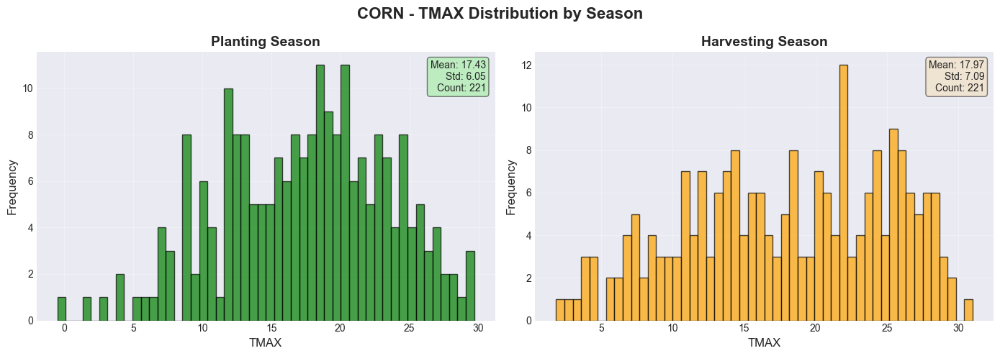

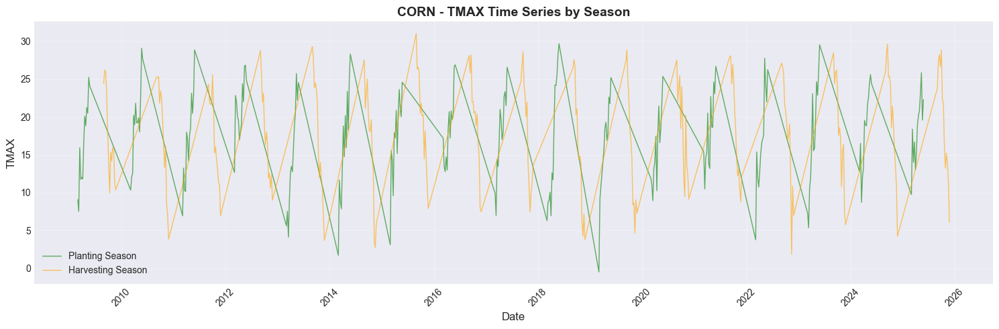

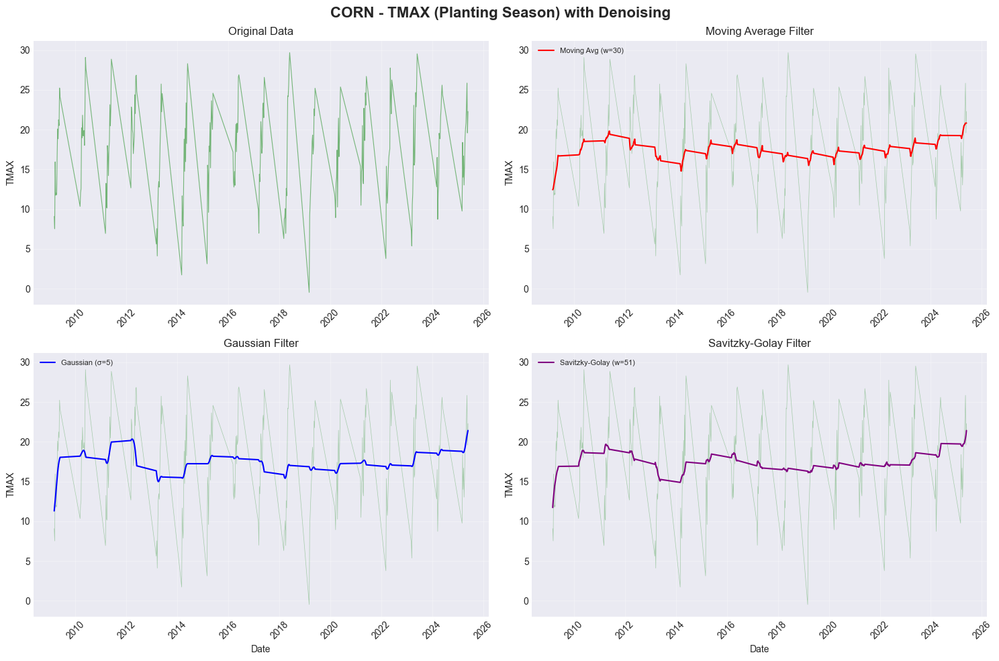

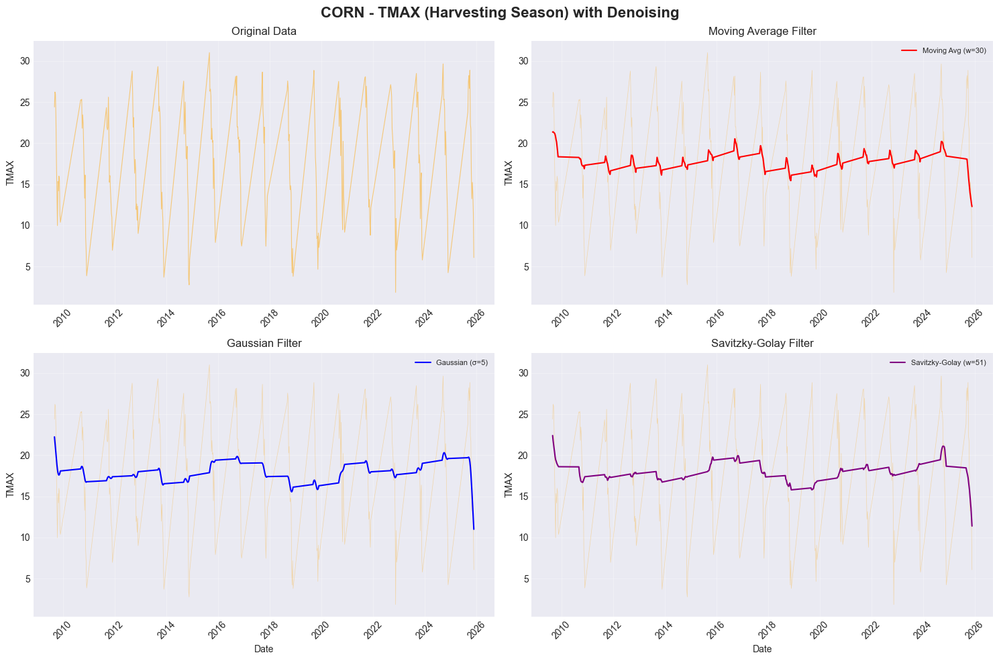


Analyzing: TMIN for CORN

Planting season data points: 221
Harvesting season data points: 221


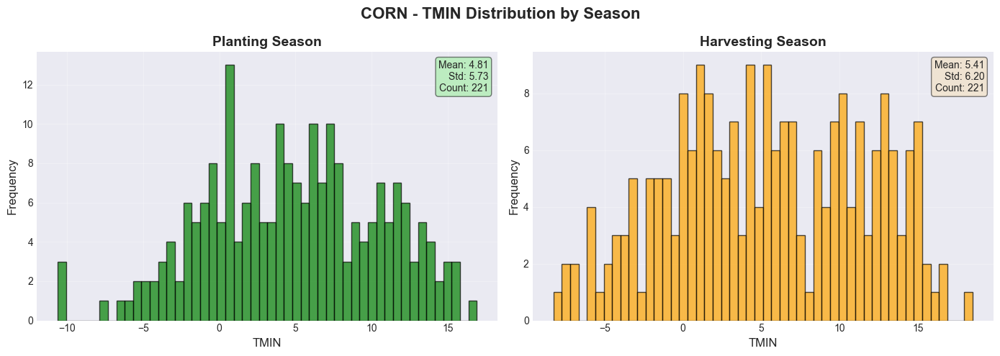

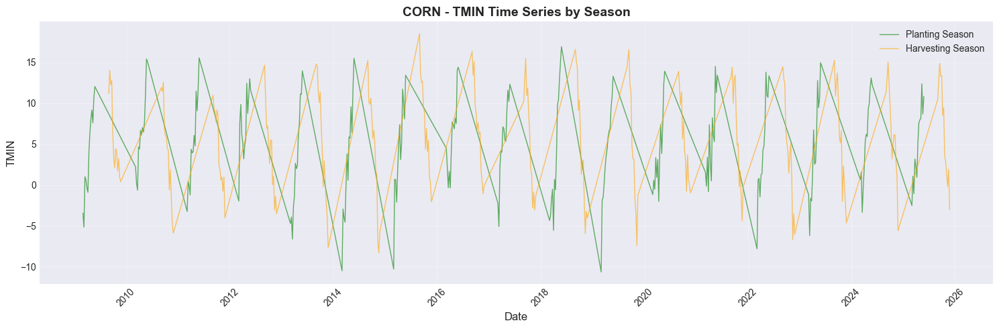

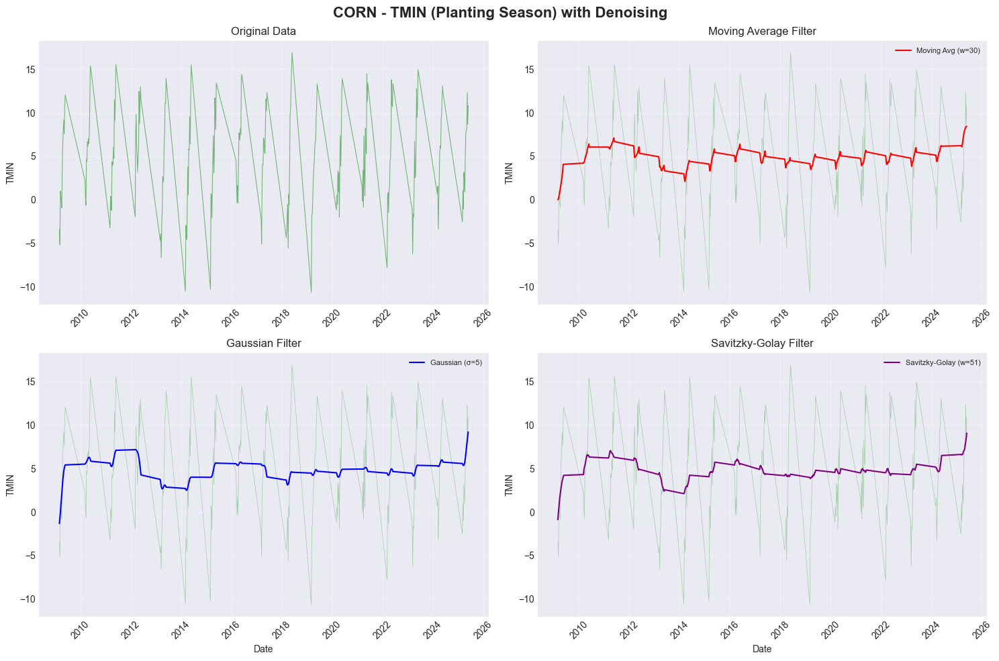

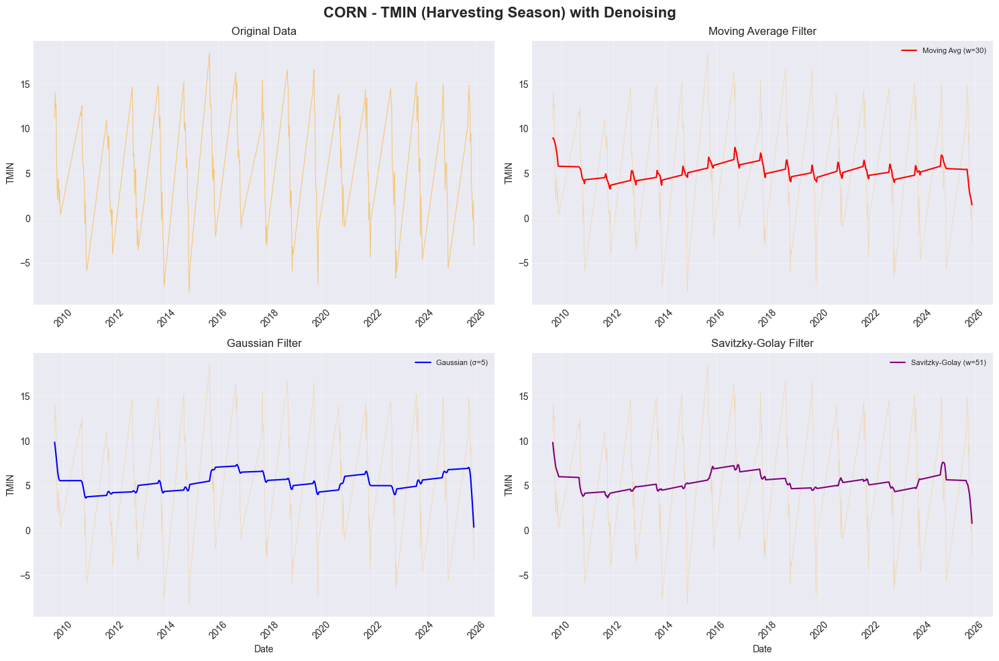


Analyzing: AWND for CORN

Planting season data points: 221
Harvesting season data points: 221


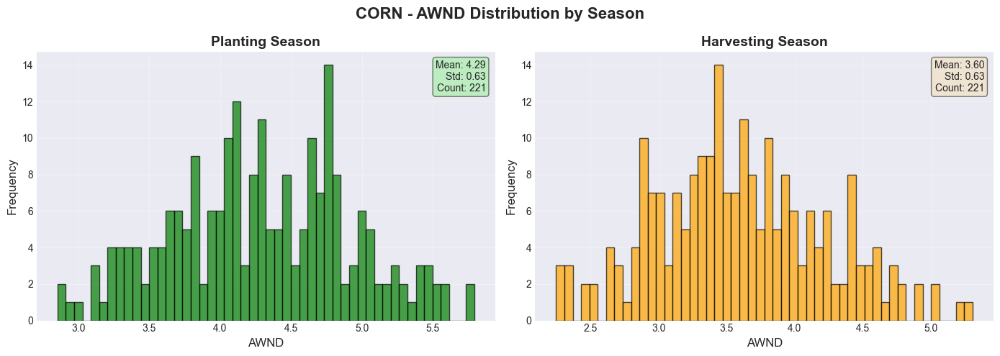

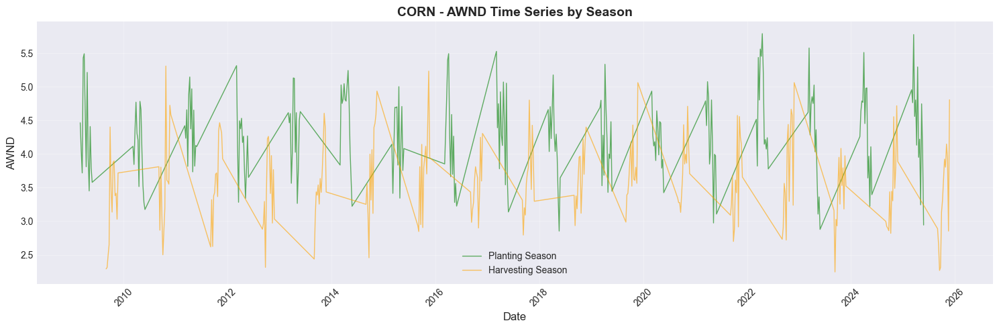

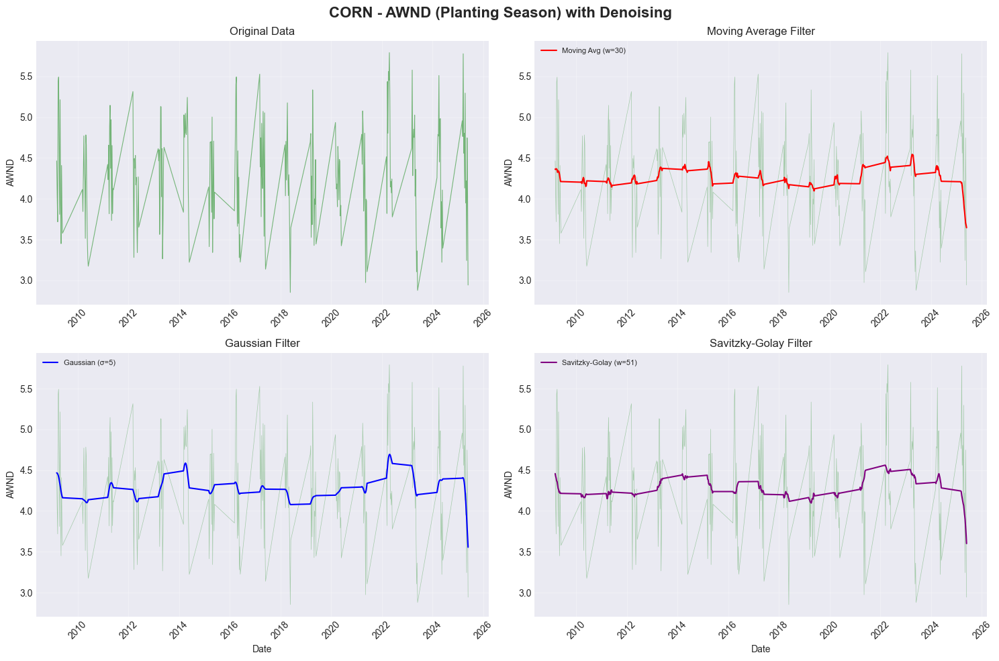

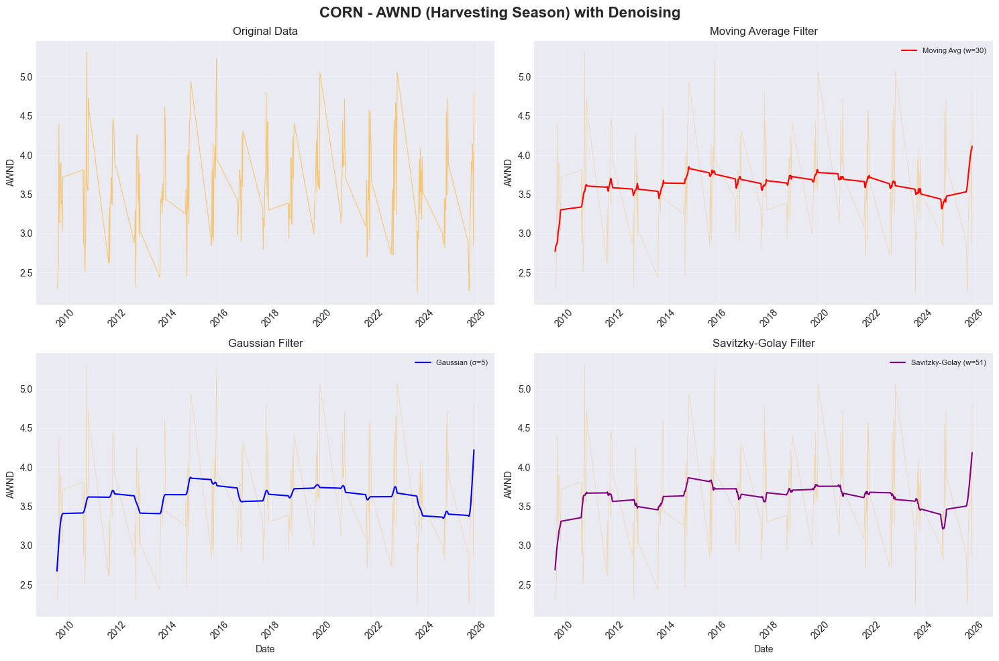


Analyzing: SPI_1m for CORN

Planting season data points: 221
Harvesting season data points: 221


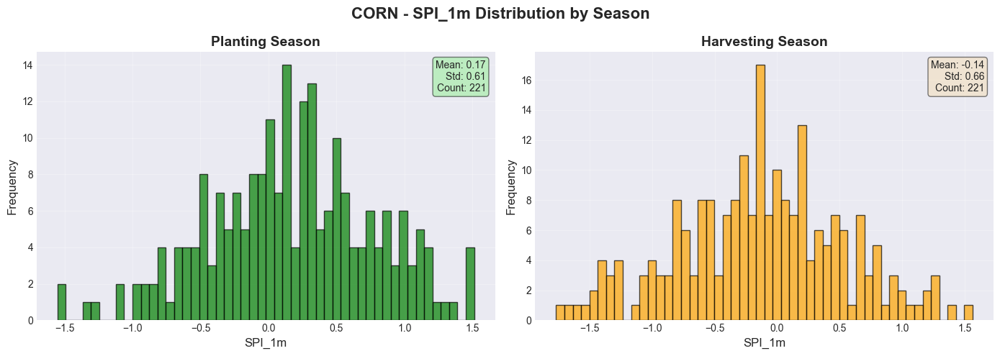

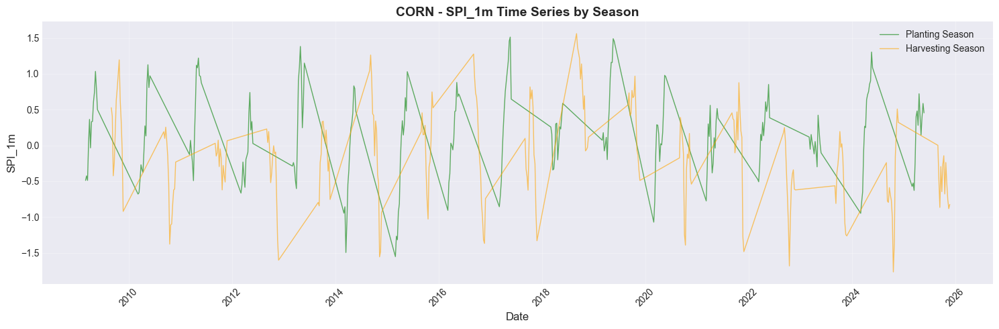

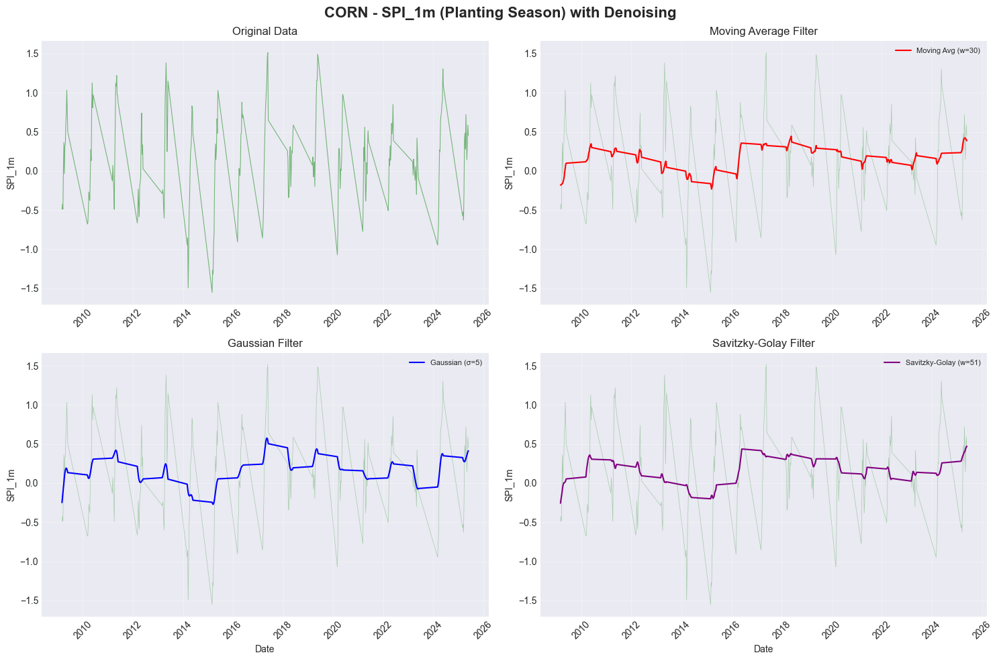

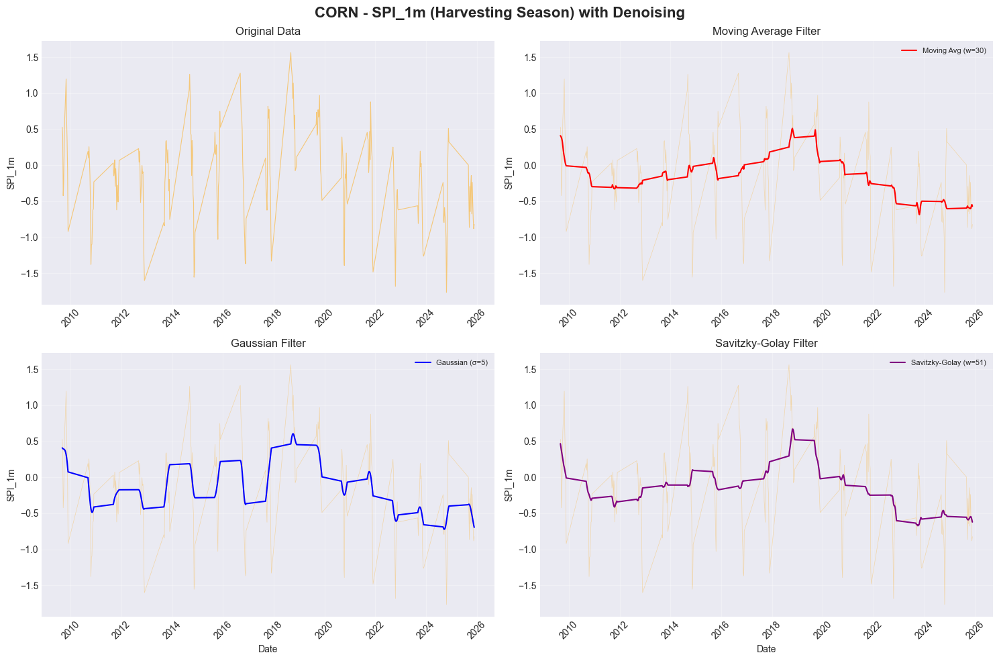


Analyzing: SPI_3m for CORN

Planting season data points: 221
Harvesting season data points: 221


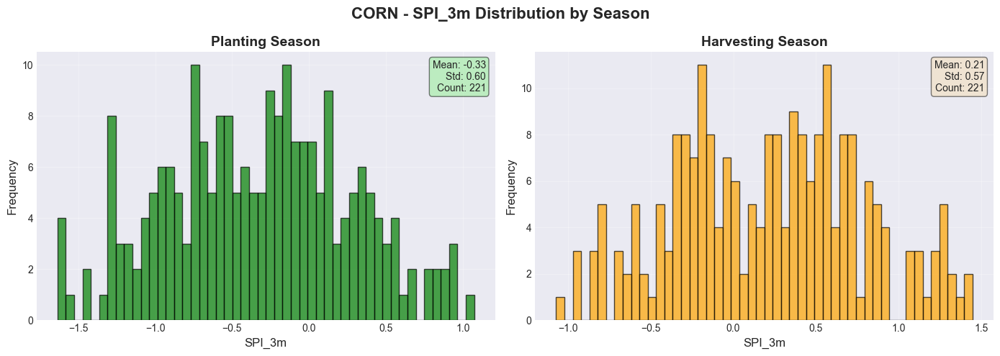

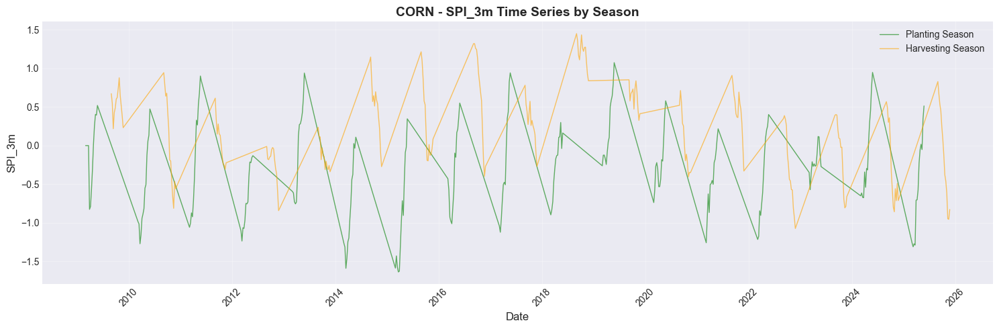

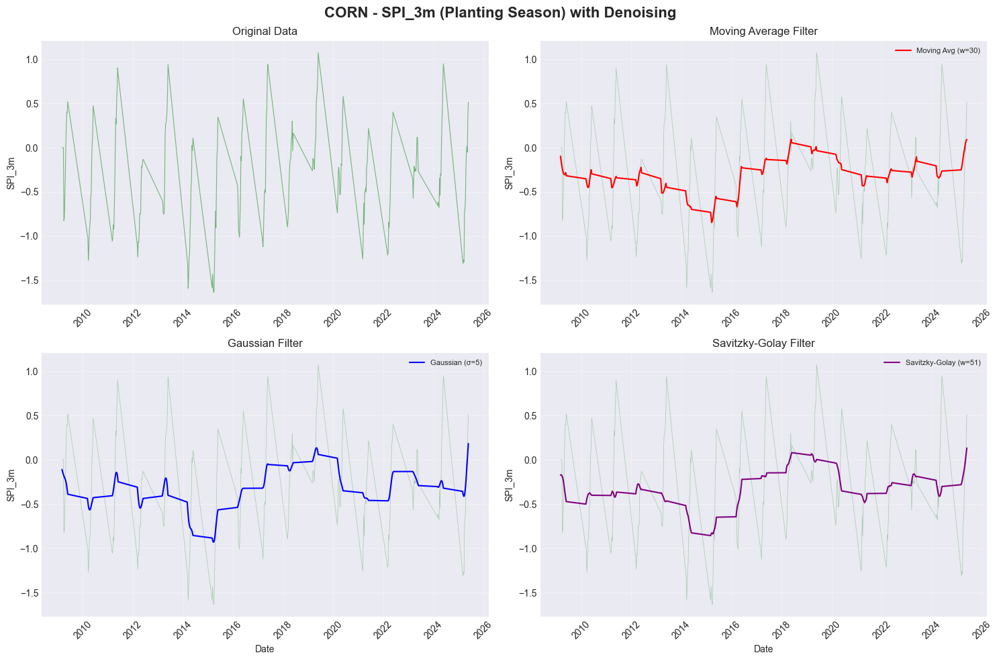

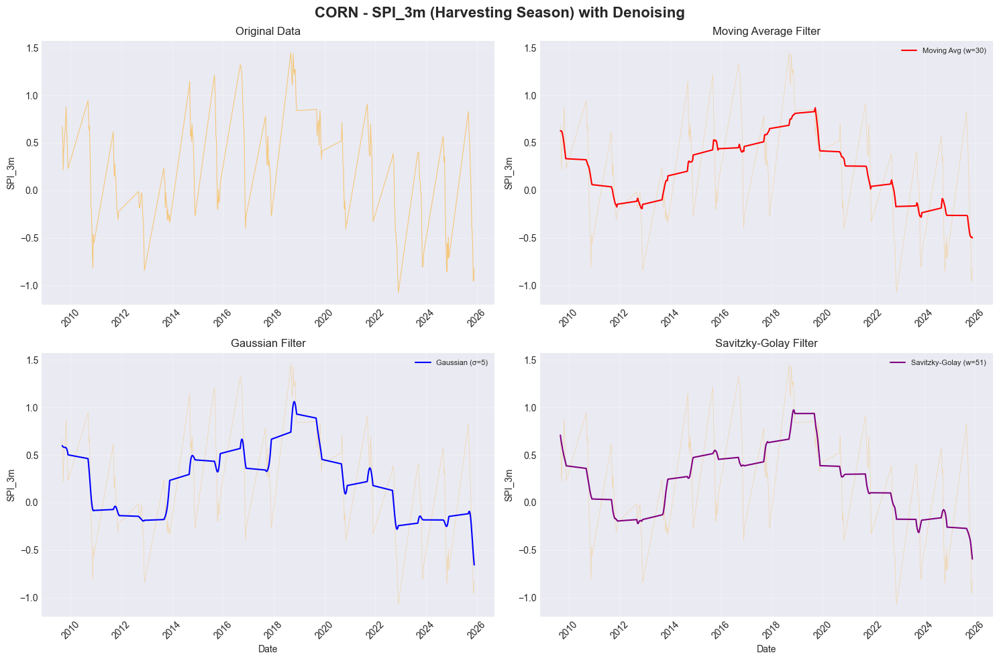


Analyzing: SPI_7d for CORN

Planting season data points: 221
Harvesting season data points: 221


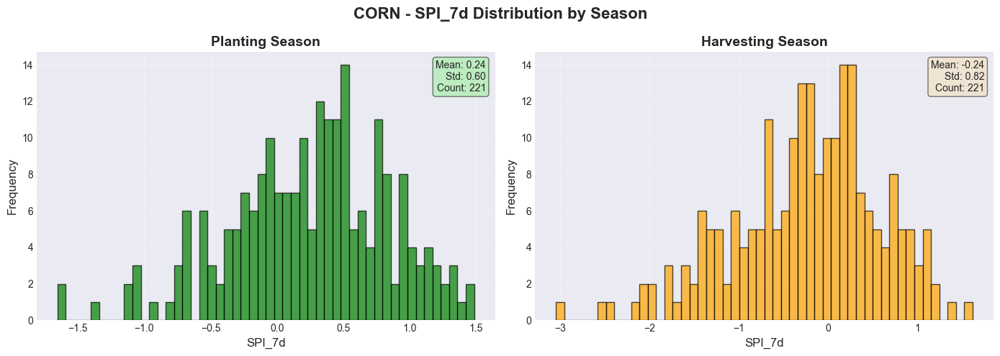

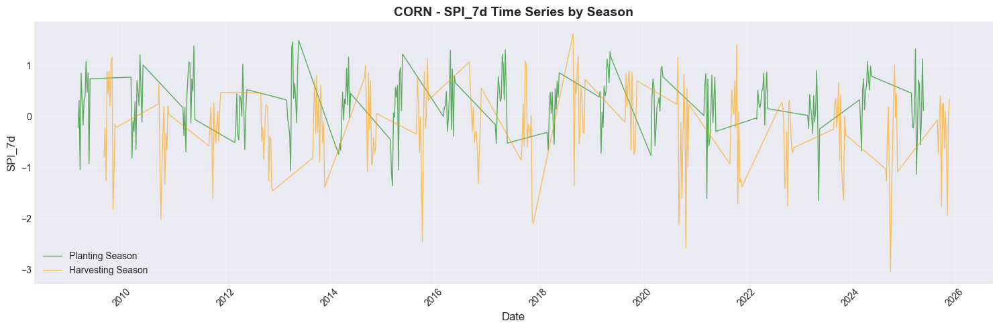

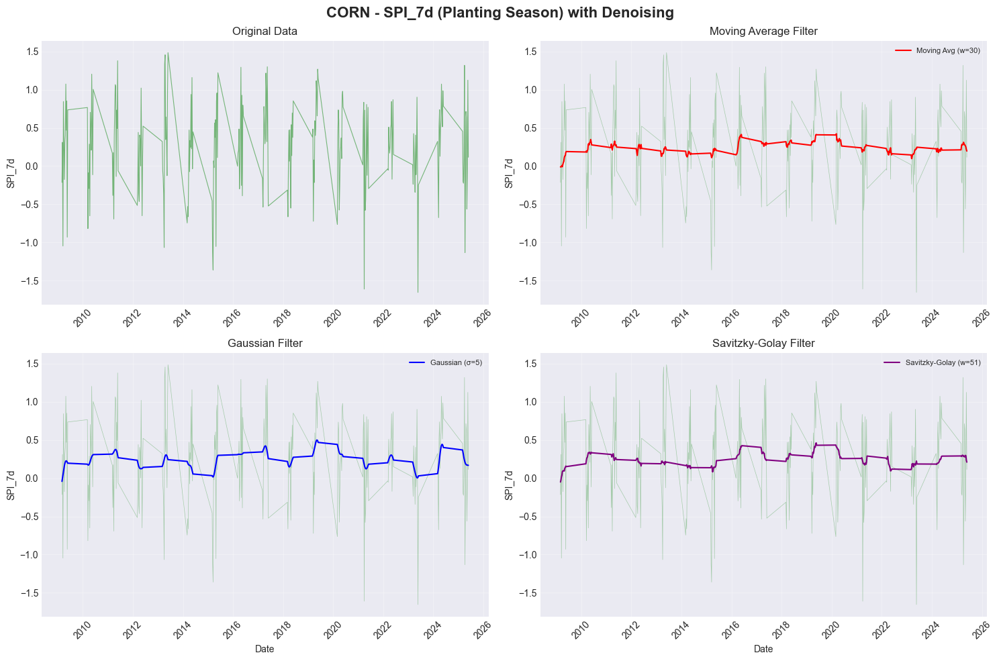

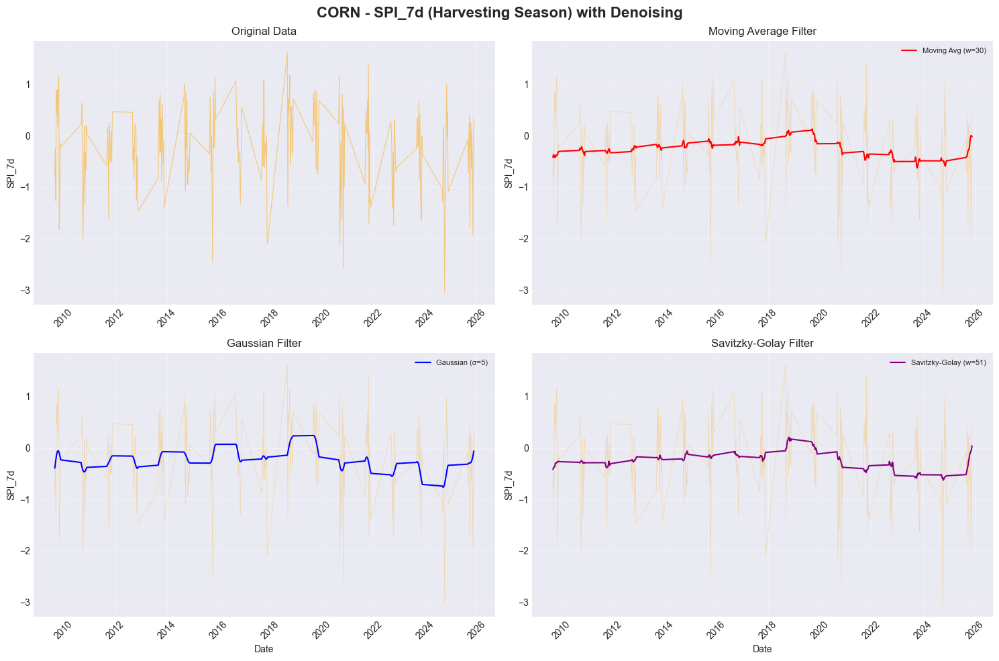

In [6]:
# Analyze each climate feature for corn
for feature in CLIMATE_FEATURES:
    if feature in df_corn.columns:
        analyze_feature_by_season(df_corn, feature, 'corn')

### Soybean

In [7]:
# Load soybean data
df_soybean = pd.read_csv(DATA_DIR / 'climate' / 'climate_weekly_weighted_soybean.csv')
df_soybean['date'] = pd.to_datetime(df_soybean['date'])

print(f"Soybean dataset shape: {df_soybean.shape}")
print(f"Date range: {df_soybean['date'].min()} to {df_soybean['date'].max()}")
print(f"\nColumns: {df_soybean.columns.tolist()}")
df_soybean.head()

Soybean dataset shape: (888, 57)
Date range: 2008-12-29 00:00:00 to 2025-12-29 00:00:00

Columns: ['date', 'week_of_year', 'year', 'month', 'is_planting_week', 'is_harvesting_week', 'TMAX', 'TMIN', 'AWND', 'SPI_1m', 'SPI_3m', 'SPI_7d', 'TMAX_zscore', 'TMIN_zscore', 'AWND_zscore', 'TMAX_q3_value_in_planting', 'TMAX_q3_value_in_harvesting', 'TMAX_q4_value_in_planting', 'TMAX_q4_value_in_harvesting', 'TMIN_q3_value_in_planting', 'TMIN_q3_value_in_harvesting', 'TMIN_q4_value_in_planting', 'TMIN_q4_value_in_harvesting', 'AWND_q3_value_in_planting', 'AWND_q3_value_in_harvesting', 'AWND_q4_value_in_planting', 'AWND_q4_value_in_harvesting', 'monthly_SPI_1m', 'seasonal_SPI_1m', 'monthly_SPI_3m', 'seasonal_SPI_3m', 'monthly_SPI_7d', 'seasonal_SPI_7d', 'monthly_TMAX_q3_value_in_planting', 'seasonal_TMAX_q3_value_in_planting', 'monthly_TMAX_q3_value_in_harvesting', 'seasonal_TMAX_q3_value_in_harvesting', 'monthly_TMAX_q4_value_in_planting', 'seasonal_TMAX_q4_value_in_planting', 'monthly_TMAX_q4_va

,date,week_of_year,year,month,is_planting_week,is_harvesting_week,TMAX,TMIN,AWND,SPI_1m,SPI_3m,SPI_7d,TMAX_zscore,TMIN_zscore,AWND_zscore,TMAX_q3_value_in_planting,TMAX_q3_value_in_harvesting,TMAX_q4_value_in_planting,TMAX_q4_value_in_harvesting,TMIN_q3_value_in_planting,TMIN_q3_value_in_harvesting,TMIN_q4_value_in_planting,TMIN_q4_value_in_harvesting,AWND_q3_value_in_planting,AWND_q3_value_in_harvesting,AWND_q4_value_in_planting,AWND_q4_value_in_harvesting,monthly_SPI_1m,seasonal_SPI_1m,monthly_SPI_3m,seasonal_SPI_3m,monthly_SPI_7d,seasonal_SPI_7d,monthly_TMAX_q3_value_in_planting,seasonal_TMAX_q3_value_in_planting,monthly_TMAX_q3_value_in_harvesting,seasonal_TMAX_q3_value_in_harvesting,monthly_TMAX_q4_value_in_planting,seasonal_TMAX_q4_value_in_planting,monthly_TMAX_q4_value_in_harvesting,seasonal_TMAX_q4_value_in_harvesting,monthly_TMIN_q3_value_in_planting,seasonal_TMIN_q3_value_in_planting,monthly_TMIN_q3_value_in_harvesting,seasonal_TMIN_q3_value_in_harvesting,monthly_TMIN_q4_value_in_planting,seasonal_TMIN_q4_value_in_planting,monthly_TMIN_q4_value_in_harvesting,seasonal_TMIN_q4_value_in_harvesting,monthly_AWND_q3_value_in_planting,seasonal_AWND_q3_value_in_planting,monthly_AWND_q3_value_in_harvesting,seasonal_AWND_q3_value_in_harvesting,monthly_AWND_q4_value_in_planting,seasonal_AWND_q4_value_in_planting,monthly_AWND_q4_value_in_harvesting,seasonal_AWND_q4_value_in_harvesting
0,2008-12-29,1,2008,12,0,0,3.289416,-8.366733,4.429108,0.000000,0.0,0.000000,0.476322,0.101312,0.574534,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2009-01-05,2,2009,1,0,0,1.359044,-8.841893,3.802280,0.000000,0.0,-0.262751,-0.179534,-0.160541,-0.697425,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,-0.131375,-0.131375,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2009-01-12,3,2009,1,0,0,-2.833026,-15.603595,4.674009,0.000000,0.0,-0.889147,-1.053662,-1.399472,0.880947,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,-0.383966,-0.383966,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2009-01-19,4,2009,1,0,0,0.582198,-11.440017,3.761146,0.000000,0.0,-1.403421,-0.451191,-0.713964,-0.553670,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,-0.638830,-0.638830,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2009-01-26,5,2009,1,0,0,-0.842247,-11.517125,3.870432,-1.333795,0.0,-0.486750,-0.942270,-0.810256,-0.415343,0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.333449,-0.266759,0.0,0.0,-0.760517,-0.608414,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0



Analyzing: TMAX for SOYBEAN

Planting season data points: 221
Harvesting season data points: 221


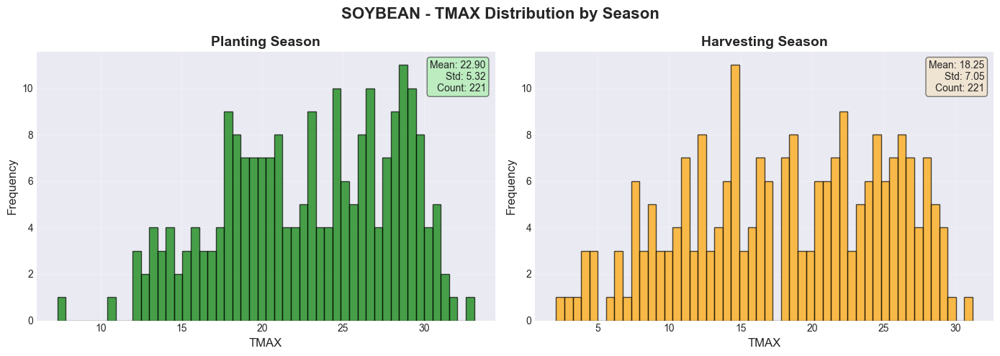

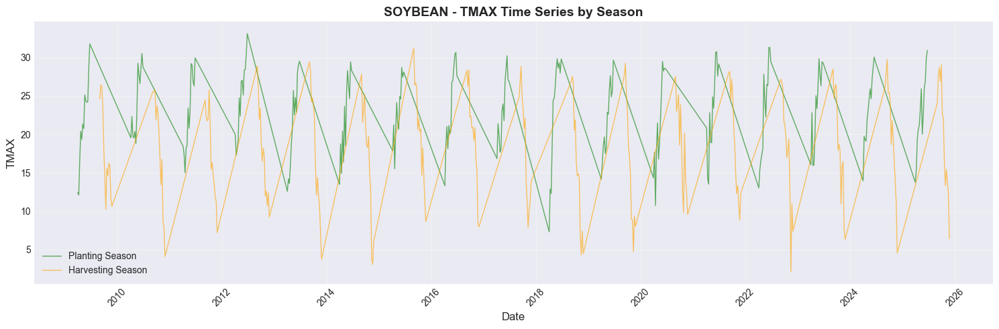

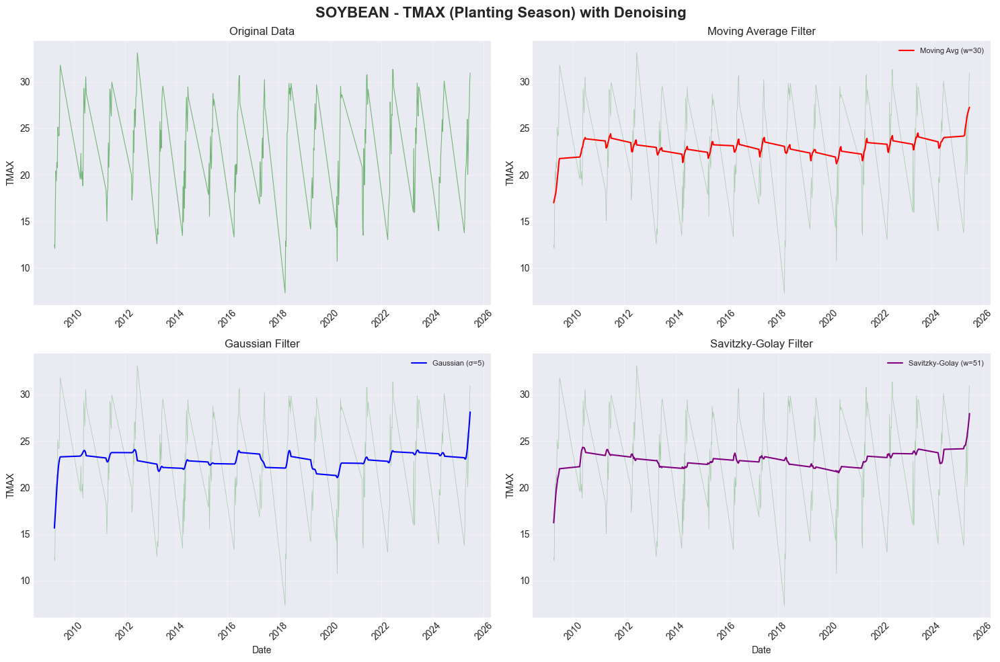

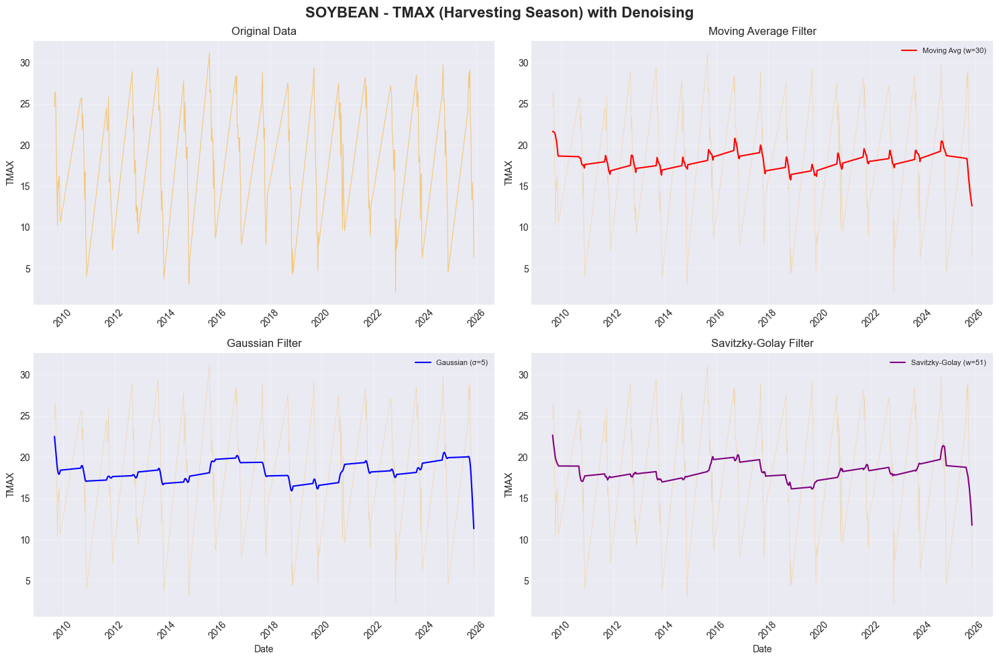


Analyzing: TMIN for SOYBEAN

Planting season data points: 221
Harvesting season data points: 221


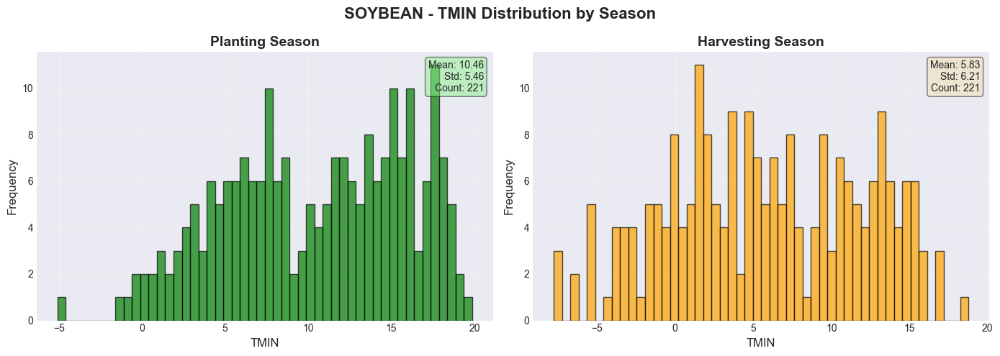

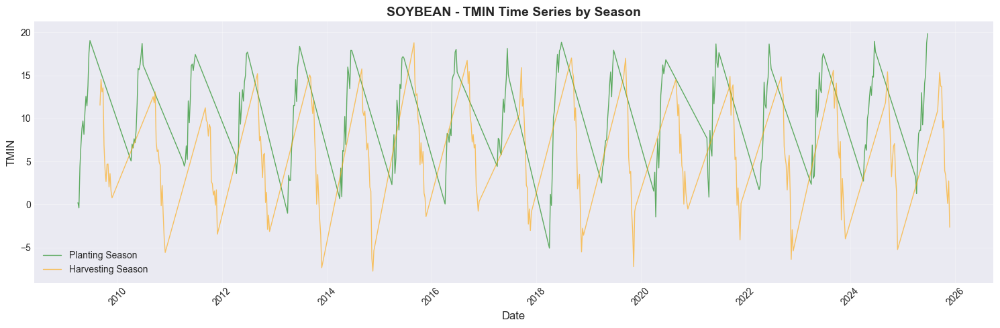

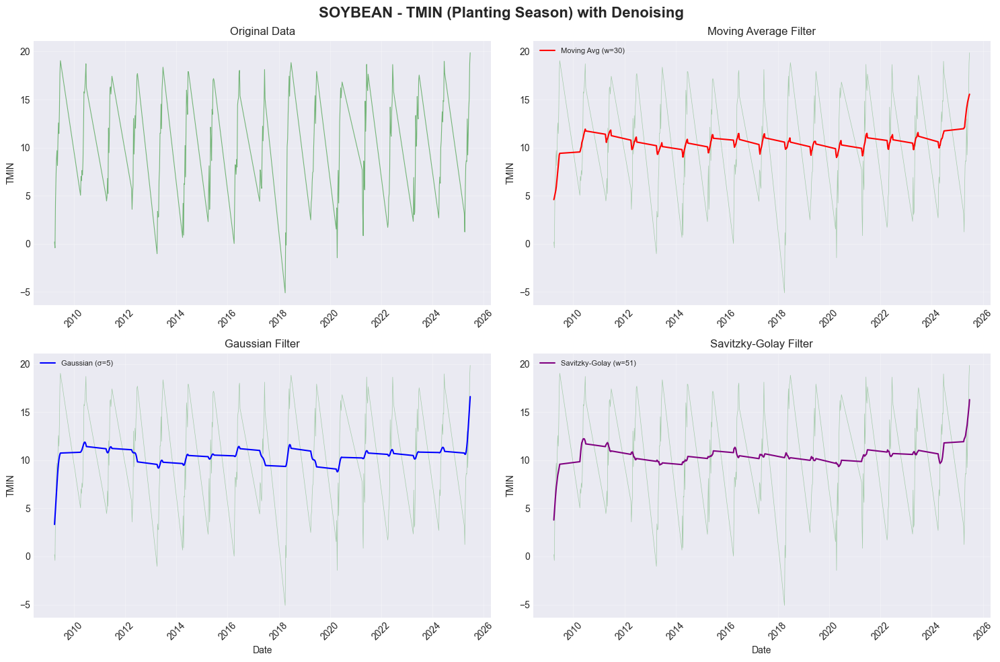

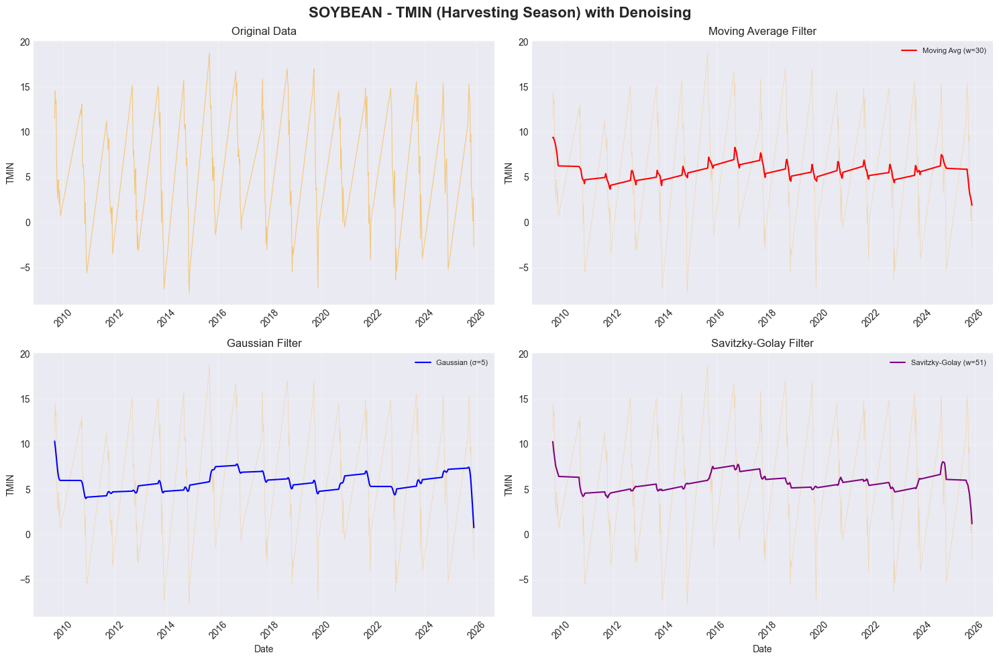


Analyzing: AWND for SOYBEAN

Planting season data points: 221
Harvesting season data points: 221


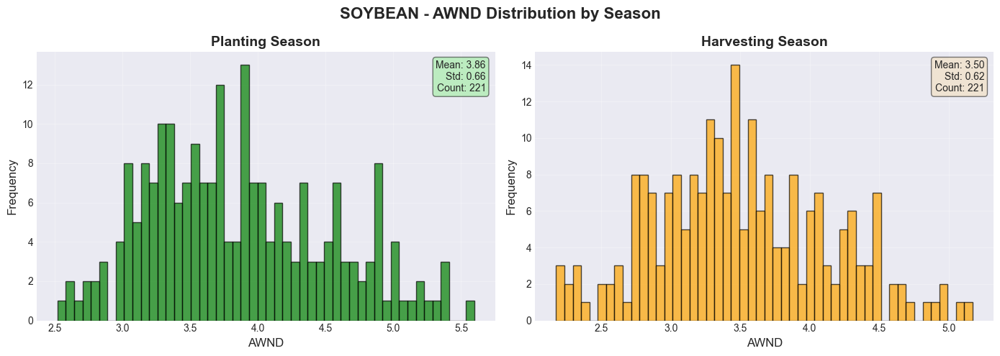

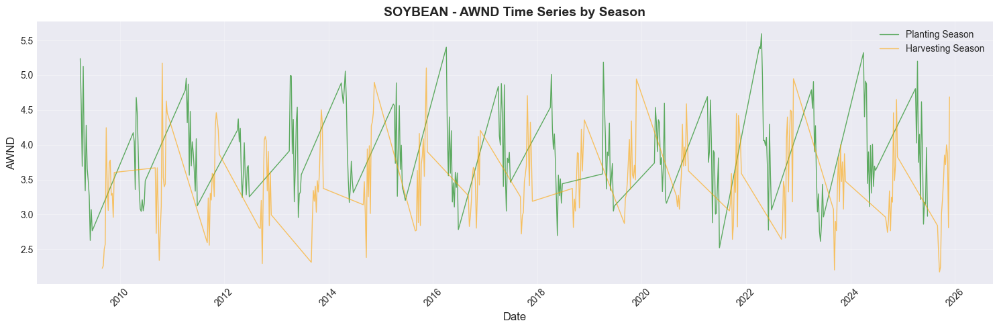

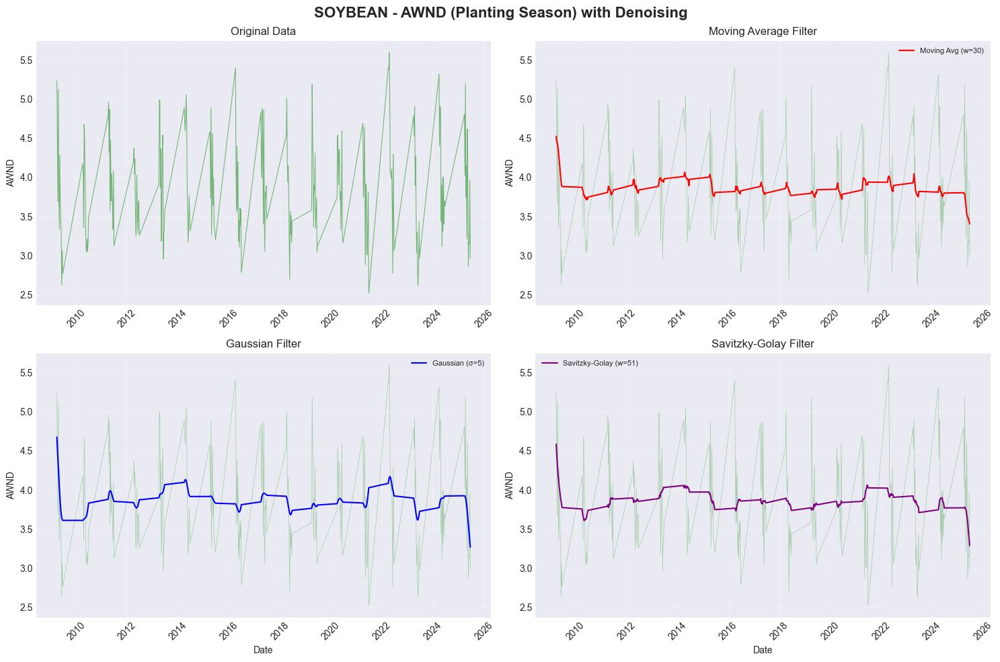

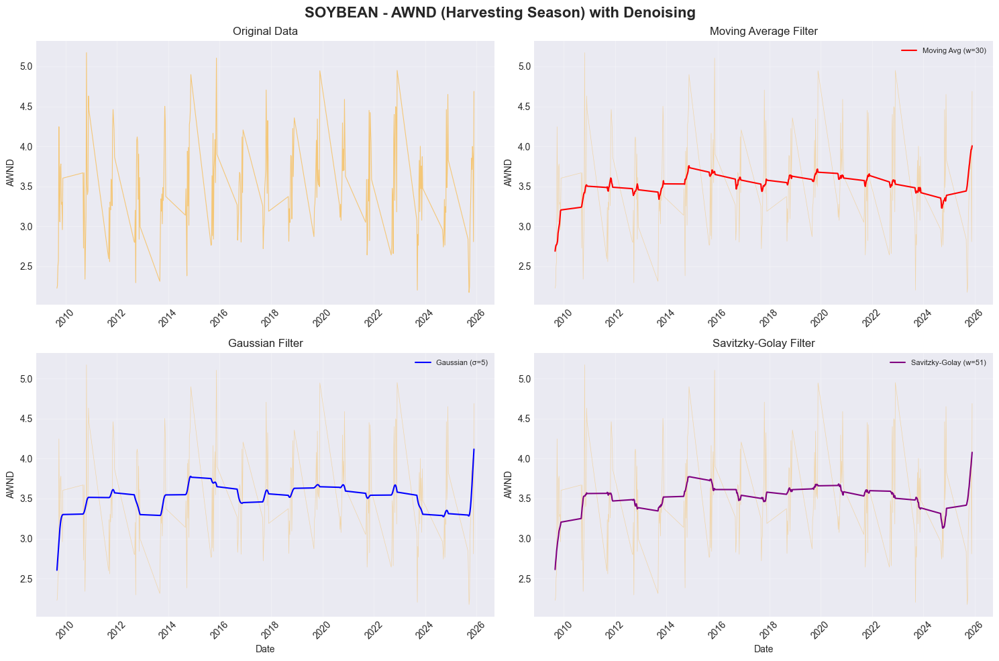


Analyzing: SPI_1m for SOYBEAN

Planting season data points: 221
Harvesting season data points: 221


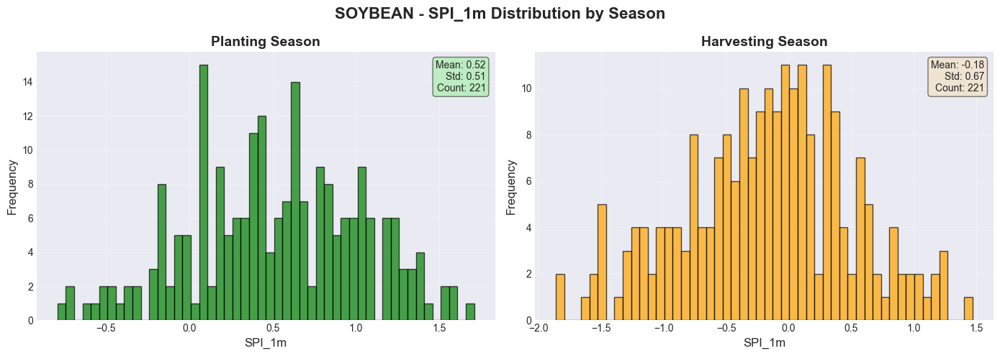

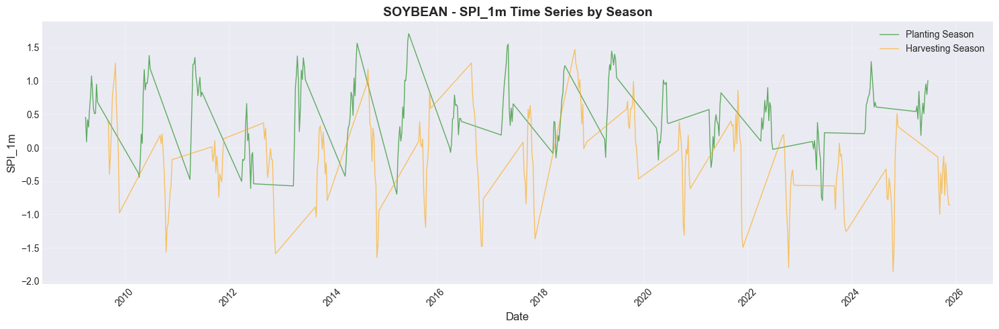

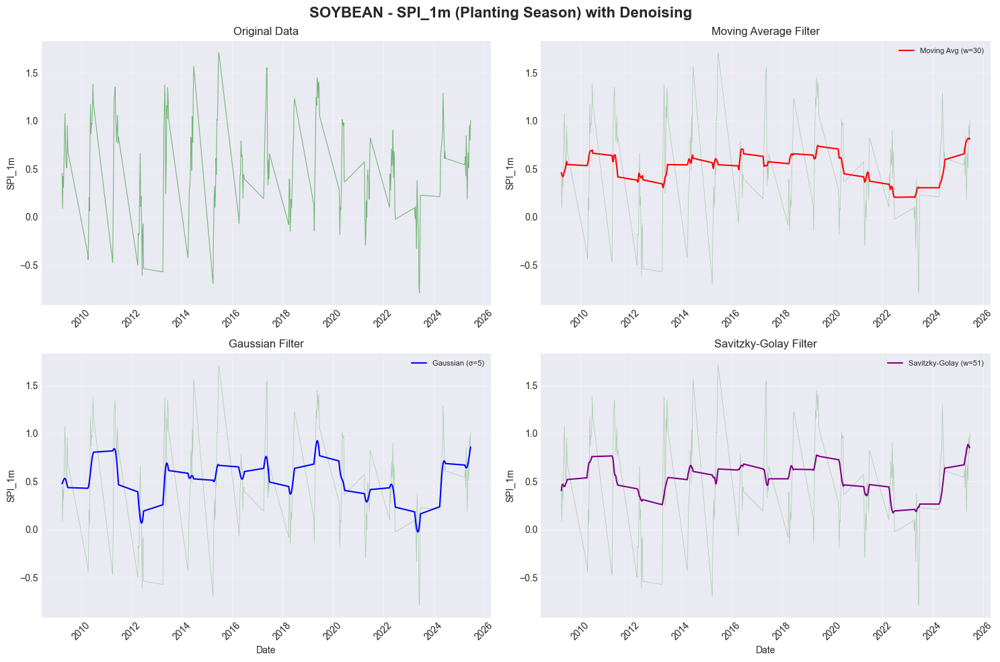

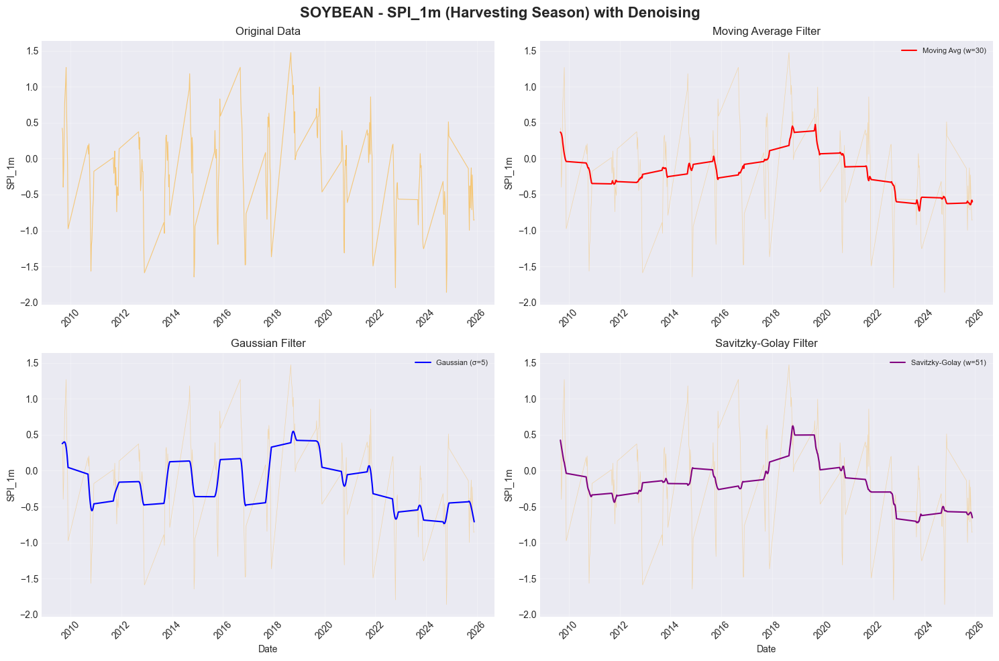


Analyzing: SPI_3m for SOYBEAN

Planting season data points: 221
Harvesting season data points: 221


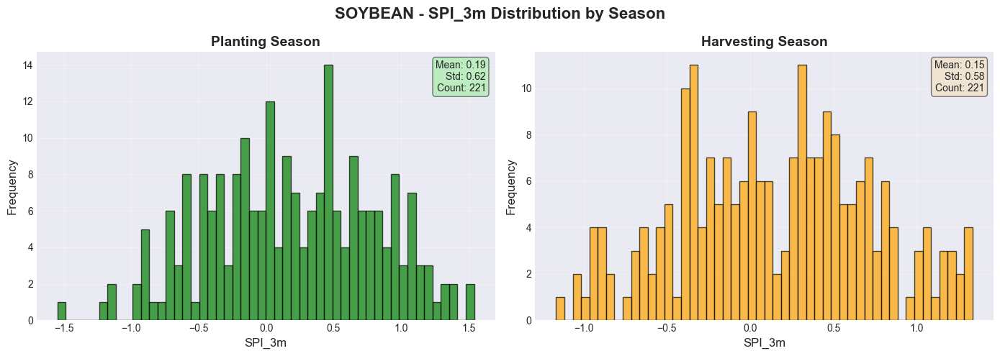

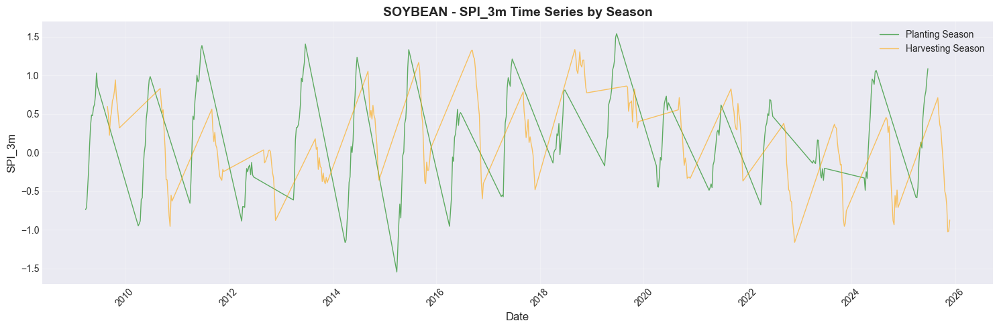

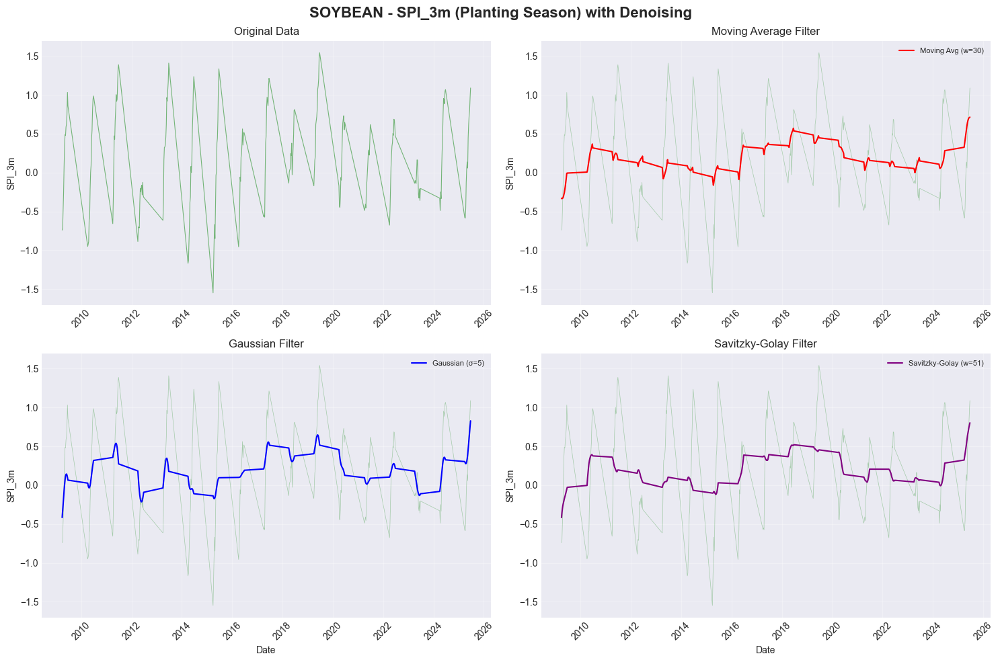

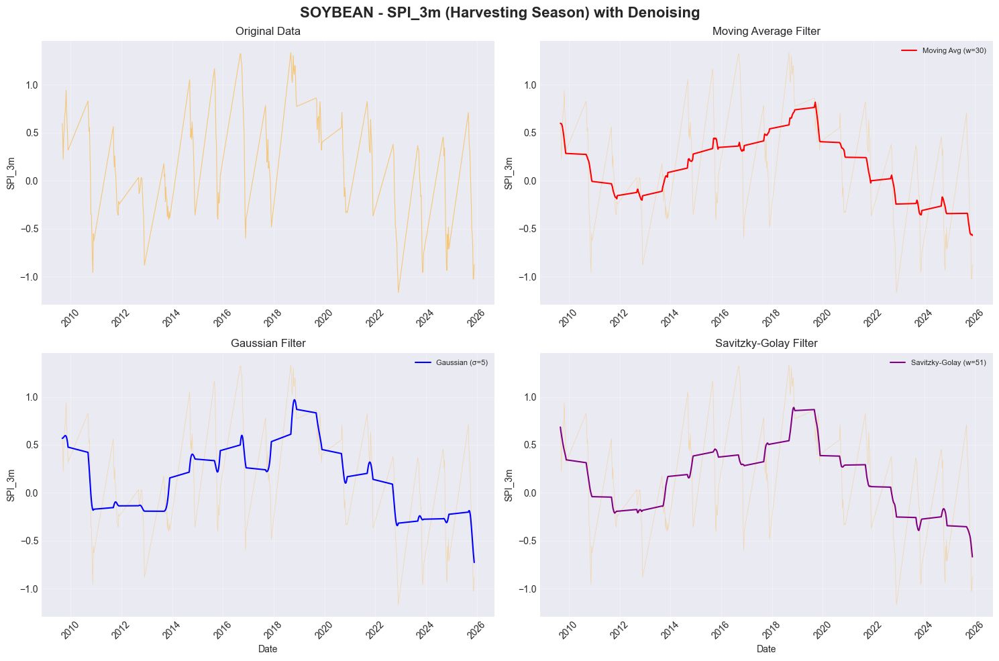


Analyzing: SPI_7d for SOYBEAN

Planting season data points: 221
Harvesting season data points: 221


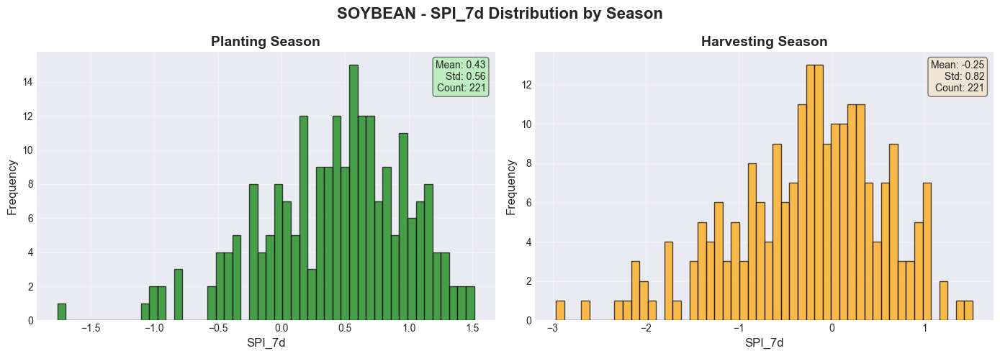

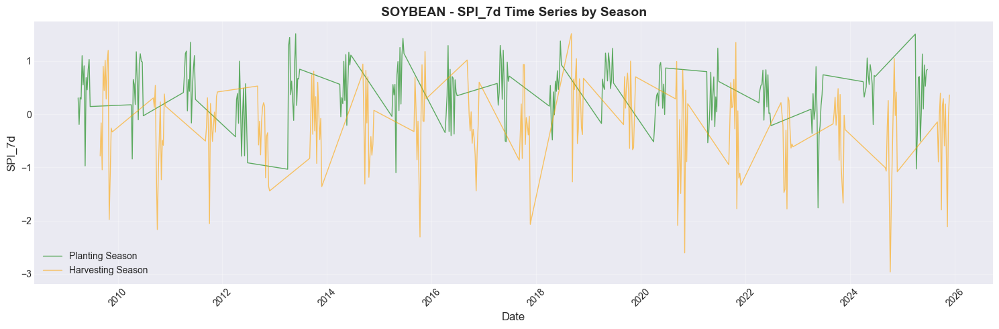

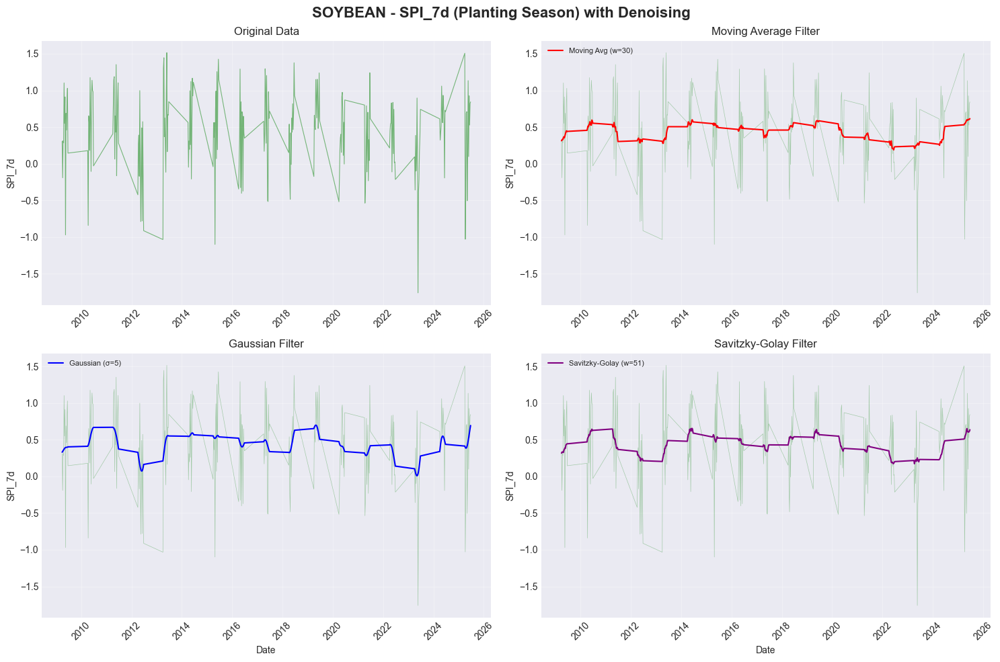

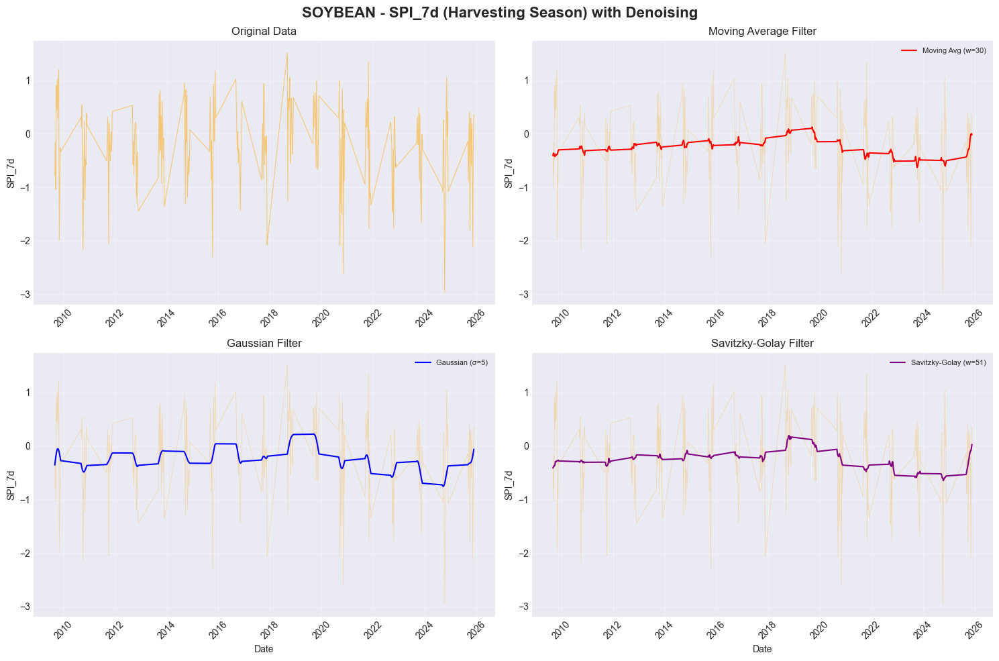

In [8]:
# Analyze each climate feature for soybean
for feature in CLIMATE_FEATURES:
    if feature in df_soybean.columns:
        analyze_feature_by_season(df_soybean, feature, 'soybean')

### Wheat

In [9]:
# Load wheat data
df_wheat = pd.read_csv(DATA_DIR / 'climate' / 'climate_weekly_weighted_wheat.csv')
df_wheat['date'] = pd.to_datetime(df_wheat['date'])

print(f"Wheat dataset shape: {df_wheat.shape}")
print(f"Date range: {df_wheat['date'].min()} to {df_wheat['date'].max()}")
print(f"\nColumns: {df_wheat.columns.tolist()}")
df_wheat.head()

Wheat dataset shape: (888, 57)
Date range: 2008-12-29 00:00:00 to 2025-12-29 00:00:00

Columns: ['date', 'week_of_year', 'year', 'month', 'is_planting_week', 'is_harvesting_week', 'TMAX', 'TMIN', 'AWND', 'SPI_1m', 'SPI_3m', 'SPI_7d', 'TMAX_zscore', 'TMIN_zscore', 'AWND_zscore', 'TMAX_q3_value_in_planting', 'TMAX_q3_value_in_harvesting', 'TMAX_q4_value_in_planting', 'TMAX_q4_value_in_harvesting', 'TMIN_q3_value_in_planting', 'TMIN_q3_value_in_harvesting', 'TMIN_q4_value_in_planting', 'TMIN_q4_value_in_harvesting', 'AWND_q3_value_in_planting', 'AWND_q3_value_in_harvesting', 'AWND_q4_value_in_planting', 'AWND_q4_value_in_harvesting', 'monthly_SPI_1m', 'seasonal_SPI_1m', 'monthly_SPI_3m', 'seasonal_SPI_3m', 'monthly_SPI_7d', 'seasonal_SPI_7d', 'monthly_TMAX_q3_value_in_planting', 'seasonal_TMAX_q3_value_in_planting', 'monthly_TMAX_q3_value_in_harvesting', 'seasonal_TMAX_q3_value_in_harvesting', 'monthly_TMAX_q4_value_in_planting', 'seasonal_TMAX_q4_value_in_planting', 'monthly_TMAX_q4_valu

,date,week_of_year,year,month,is_planting_week,is_harvesting_week,TMAX,TMIN,AWND,SPI_1m,SPI_3m,SPI_7d,TMAX_zscore,TMIN_zscore,AWND_zscore,TMAX_q3_value_in_planting,TMAX_q3_value_in_harvesting,TMAX_q4_value_in_planting,TMAX_q4_value_in_harvesting,TMIN_q3_value_in_planting,TMIN_q3_value_in_harvesting,TMIN_q4_value_in_planting,TMIN_q4_value_in_harvesting,AWND_q3_value_in_planting,AWND_q3_value_in_harvesting,AWND_q4_value_in_planting,AWND_q4_value_in_harvesting,monthly_SPI_1m,seasonal_SPI_1m,monthly_SPI_3m,seasonal_SPI_3m,monthly_SPI_7d,seasonal_SPI_7d,monthly_TMAX_q3_value_in_planting,seasonal_TMAX_q3_value_in_planting,monthly_TMAX_q3_value_in_harvesting,seasonal_TMAX_q3_value_in_harvesting,monthly_TMAX_q4_value_in_planting,seasonal_TMAX_q4_value_in_planting,monthly_TMAX_q4_value_in_harvesting,seasonal_TMAX_q4_value_in_harvesting,monthly_TMIN_q3_value_in_planting,seasonal_TMIN_q3_value_in_planting,monthly_TMIN_q3_value_in_harvesting,seasonal_TMIN_q3_value_in_harvesting,monthly_TMIN_q4_value_in_planting,seasonal_TMIN_q4_value_in_planting,monthly_TMIN_q4_value_in_harvesting,seasonal_TMIN_q4_value_in_harvesting,monthly_AWND_q3_value_in_planting,seasonal_AWND_q3_value_in_planting,monthly_AWND_q3_value_in_harvesting,seasonal_AWND_q3_value_in_harvesting,monthly_AWND_q4_value_in_planting,seasonal_AWND_q4_value_in_planting,monthly_AWND_q4_value_in_harvesting,seasonal_AWND_q4_value_in_harvesting
0,2008-12-29,1,2008,12,0,0,2.733711,-10.144065,4.392906,0.000000,0.0,0.000000,0.298709,-0.341487,1.099360,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2009-01-05,2,2009,1,0,0,2.630792,-8.482901,3.887690,0.000000,0.0,-0.144730,-0.003457,-0.117703,-0.351195,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,-0.072365,-0.072365,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2009-01-12,3,2009,1,0,0,1.503348,-11.544296,4.354387,0.000000,0.0,-0.977229,-0.351867,-0.994717,0.769789,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,-0.373986,-0.373986,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2009-01-19,4,2009,1,0,0,3.107813,-9.205357,3.821561,0.000000,0.0,-1.261567,-0.149345,-0.525150,-0.177493,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,-0.595881,-0.595881,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2009-01-26,5,2009,1,0,0,1.050910,-10.685157,4.106382,-1.106142,0.0,-0.548105,-0.805491,-0.863574,0.268744,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.276535,-0.221228,0.0,0.0,-0.732907,-0.586326,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0



Analyzing: TMAX for WHEAT

Planting season data points: 374
Harvesting season data points: 272


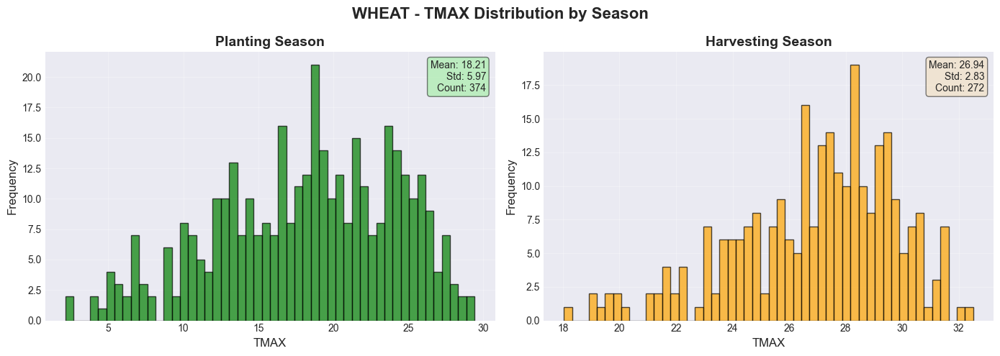

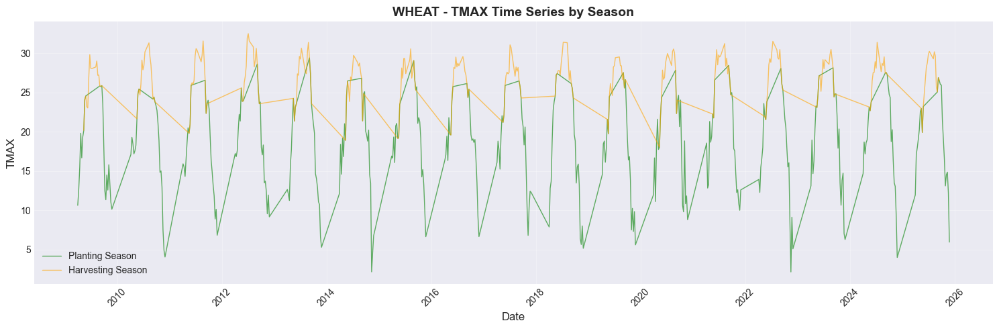

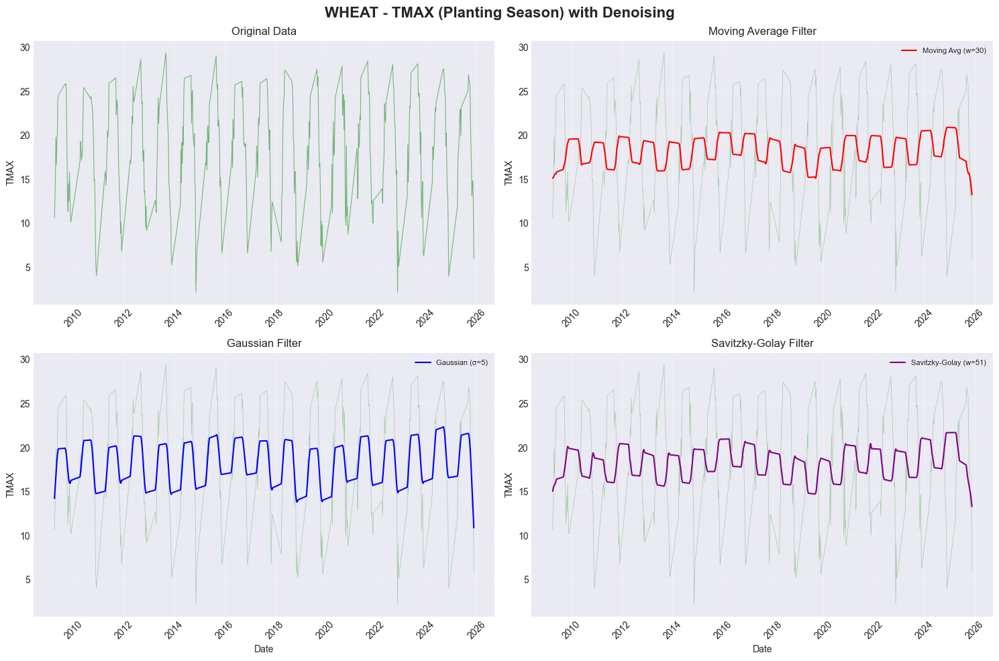

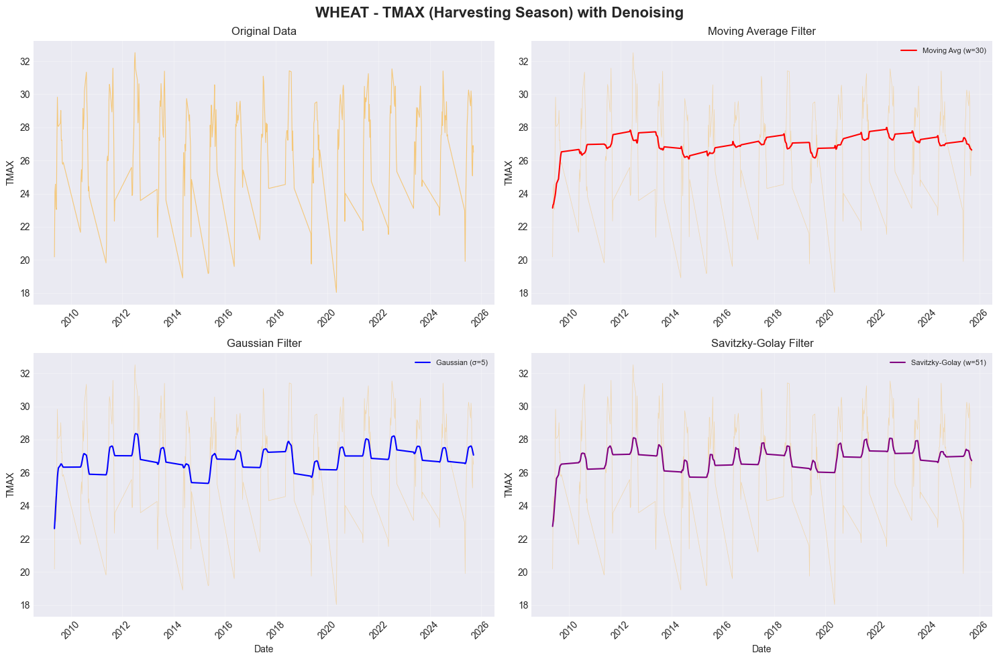


Analyzing: TMIN for WHEAT

Planting season data points: 374
Harvesting season data points: 272


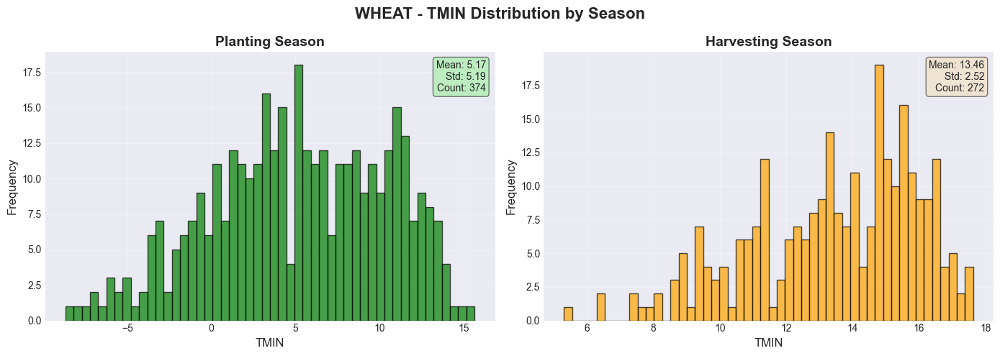

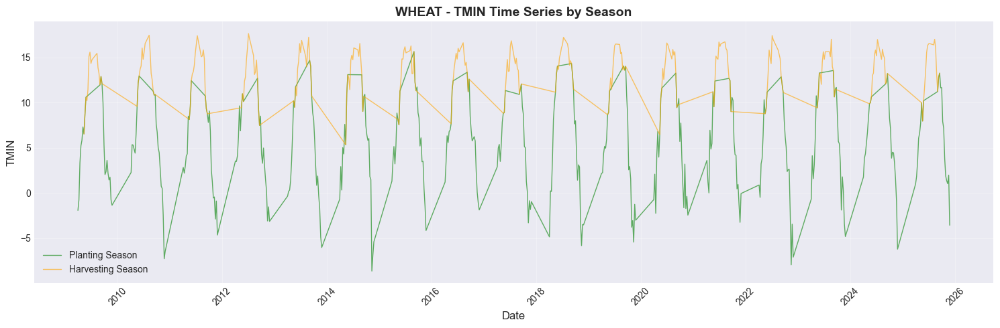

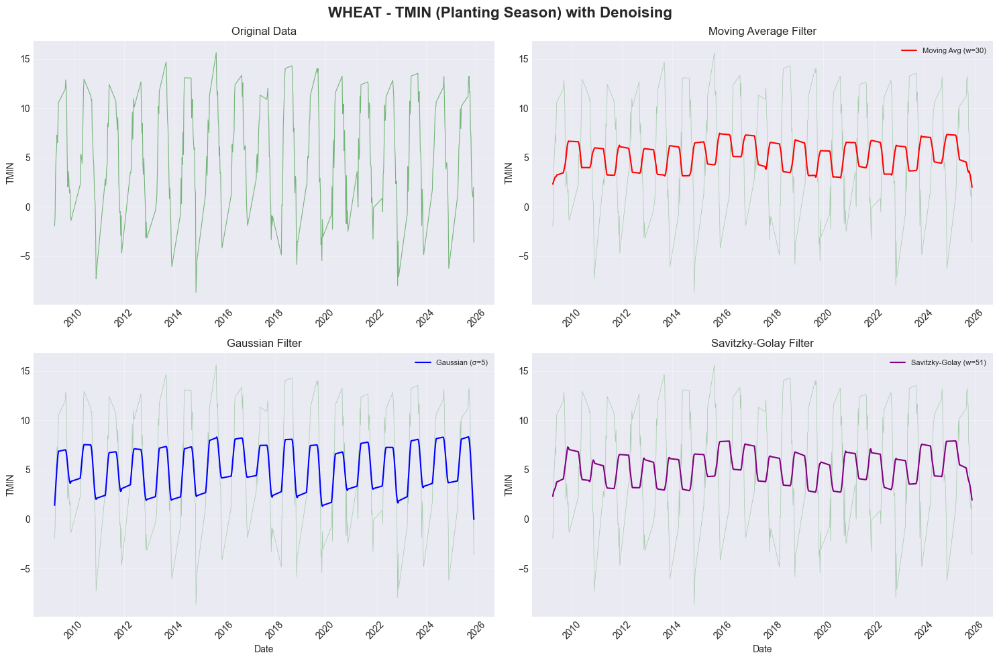

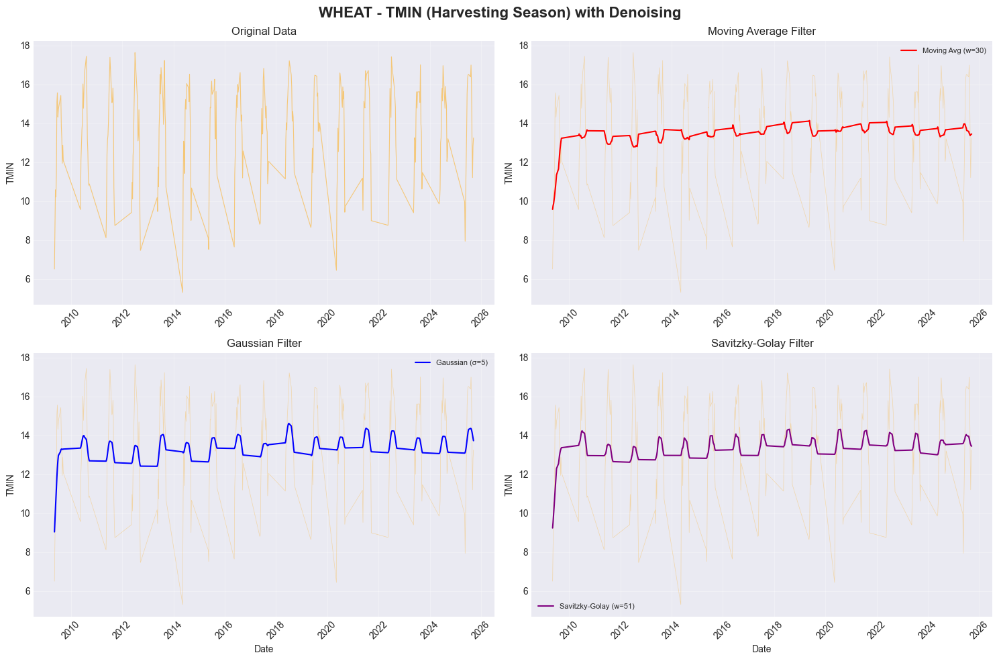


Analyzing: AWND for WHEAT

Planting season data points: 374
Harvesting season data points: 272


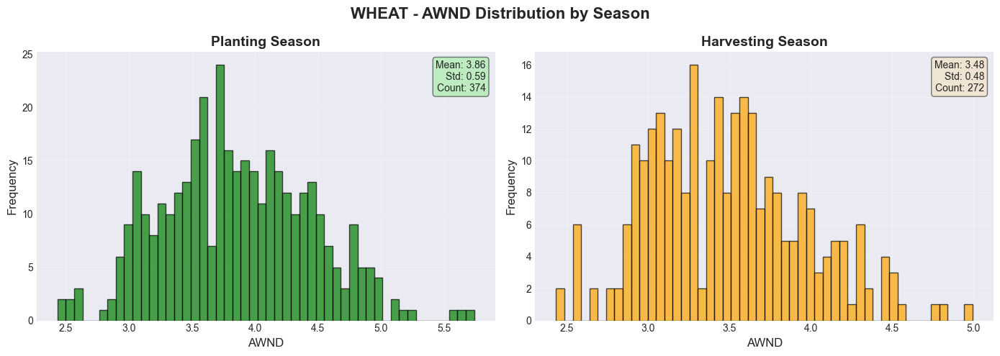

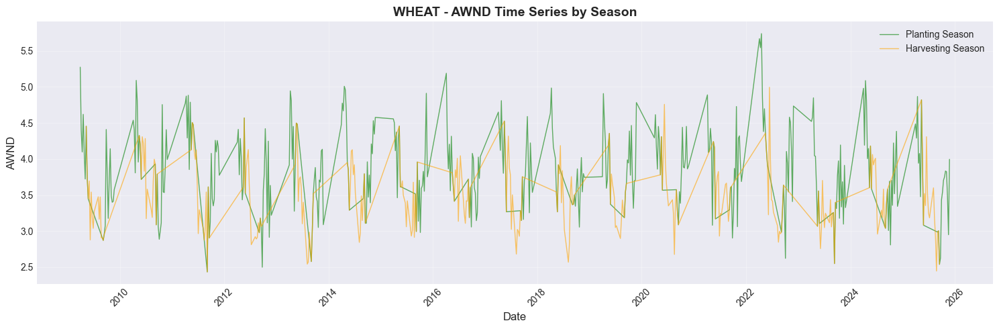

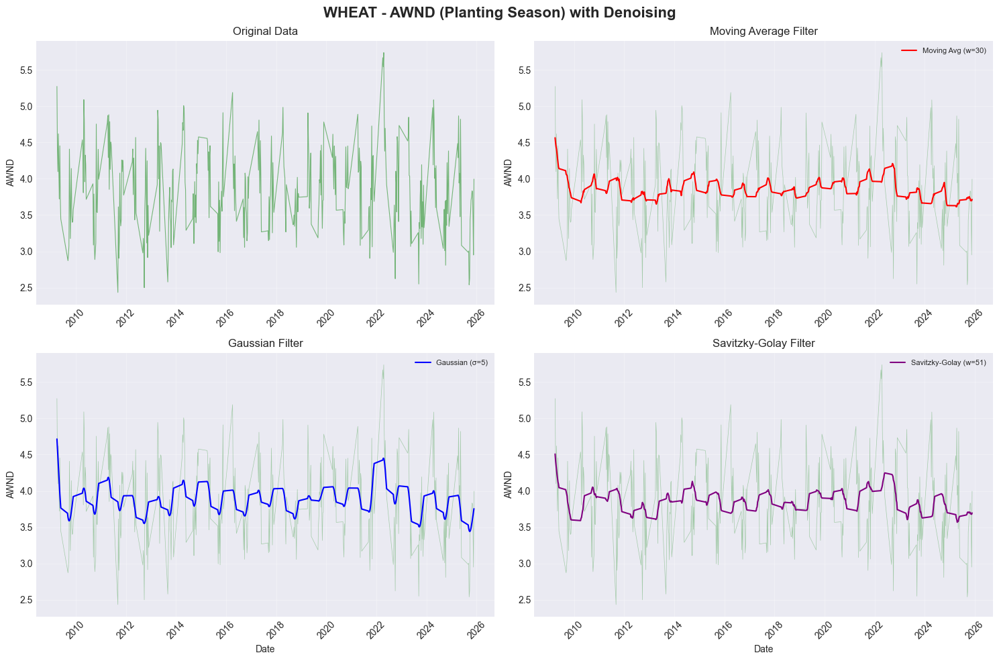

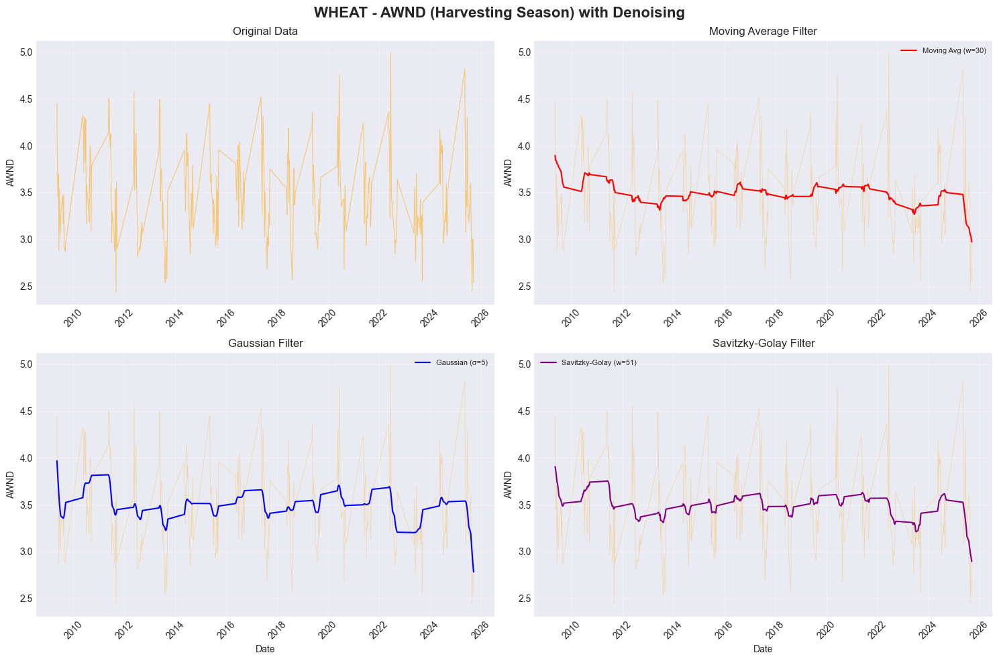


Analyzing: SPI_1m for WHEAT

Planting season data points: 374
Harvesting season data points: 272


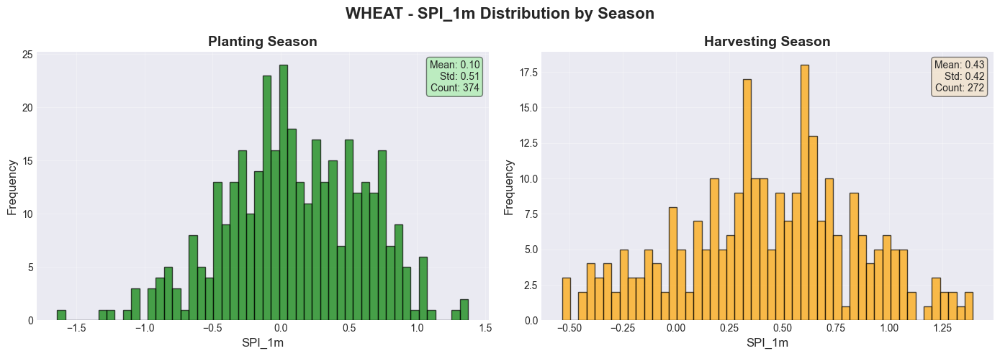

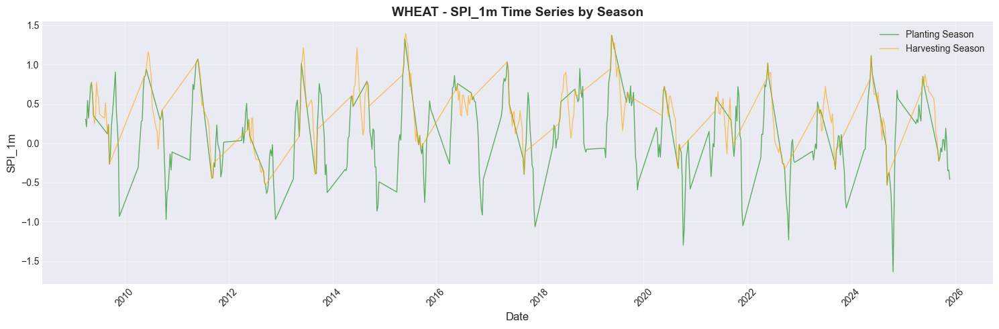

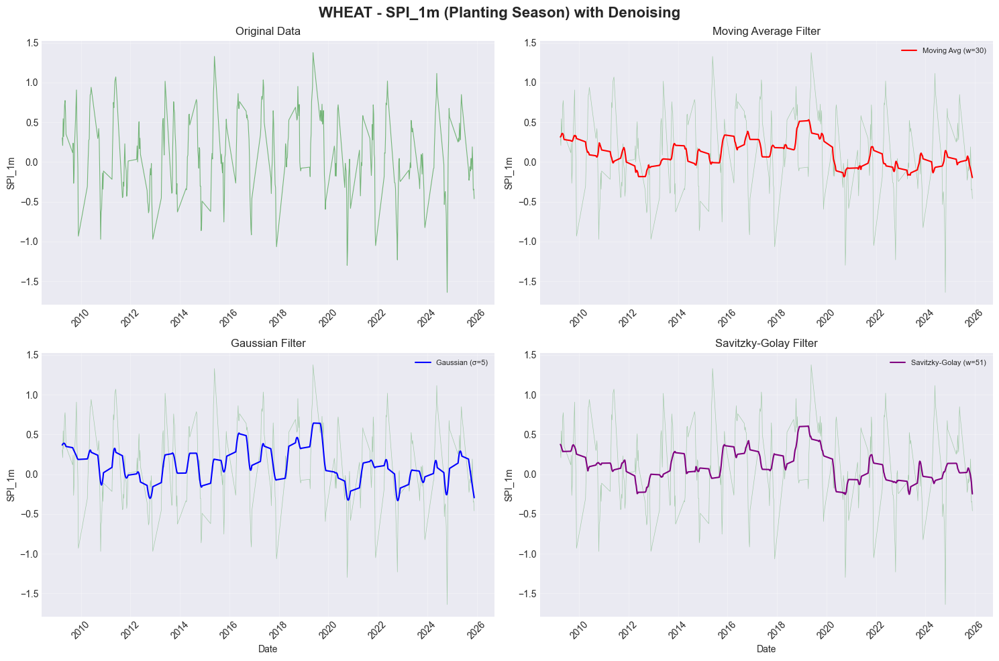

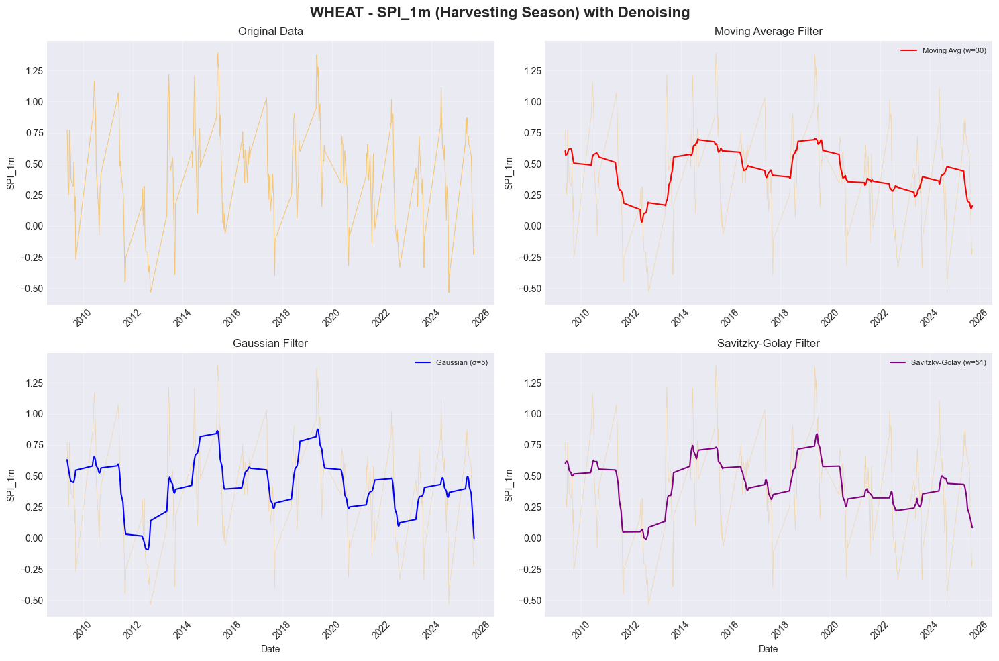


Analyzing: SPI_3m for WHEAT

Planting season data points: 374
Harvesting season data points: 272


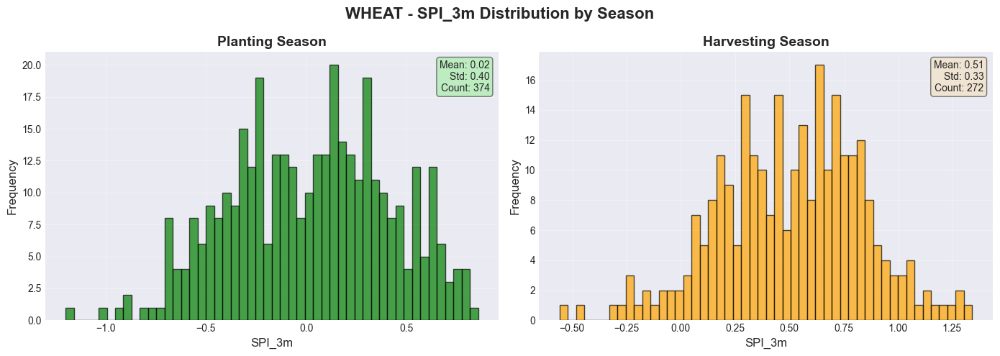

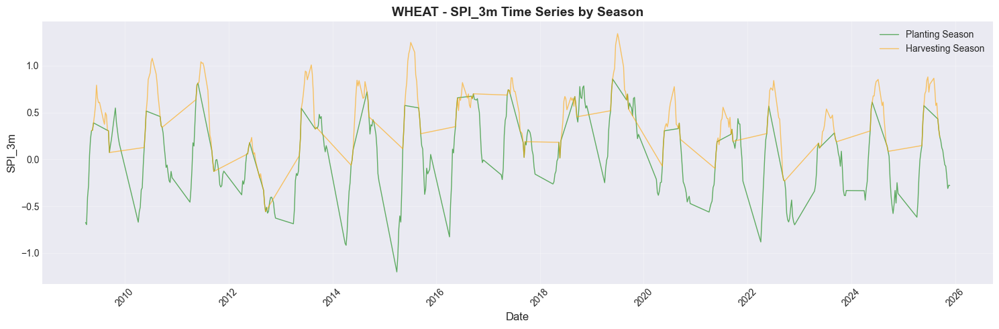

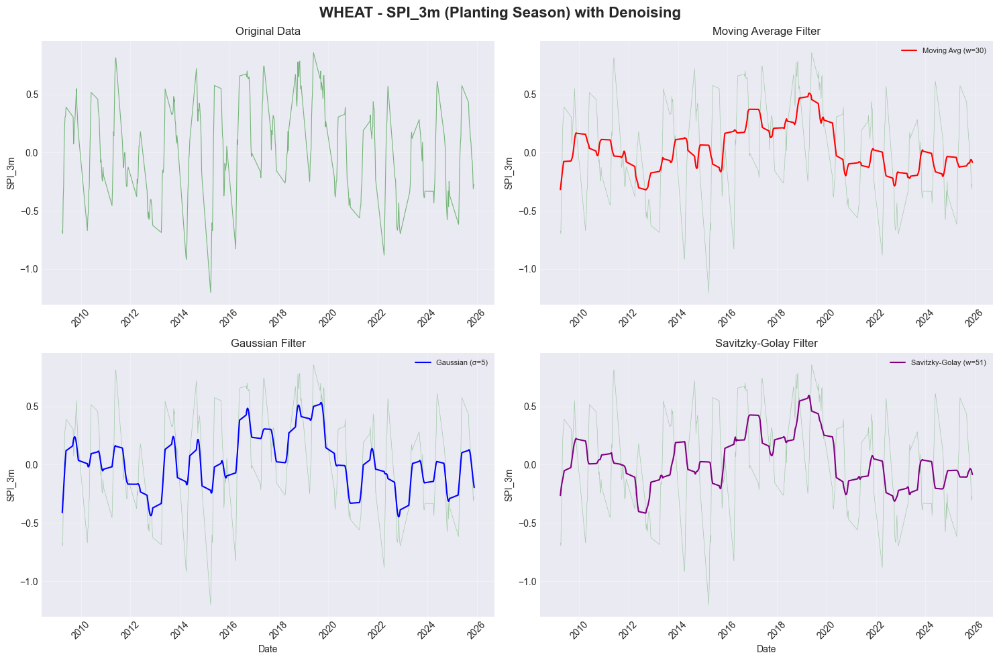

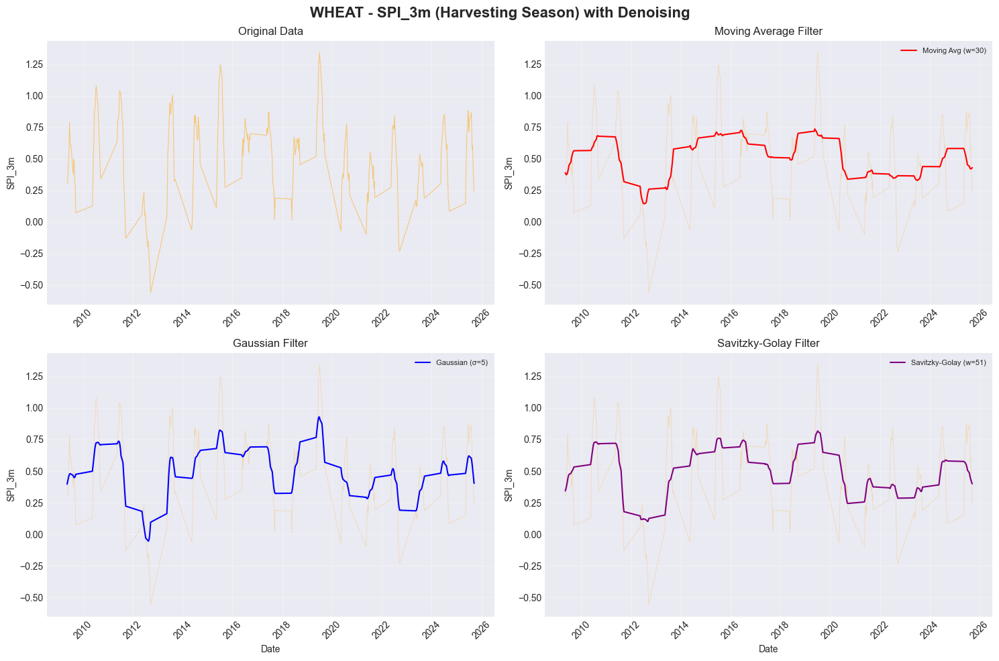


Analyzing: SPI_7d for WHEAT

Planting season data points: 374
Harvesting season data points: 272


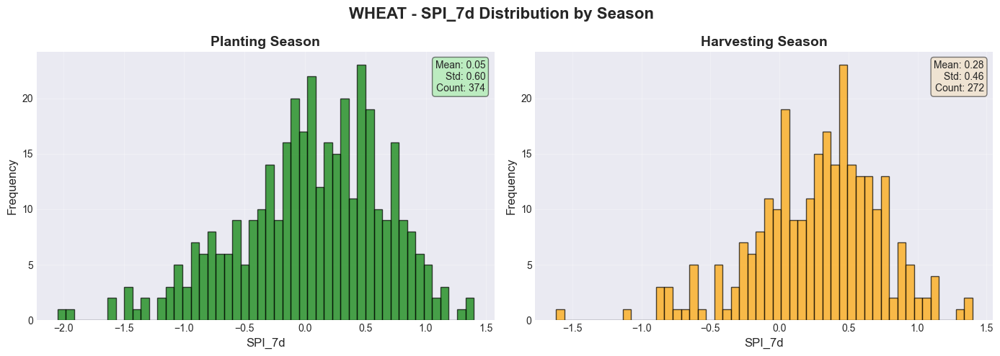

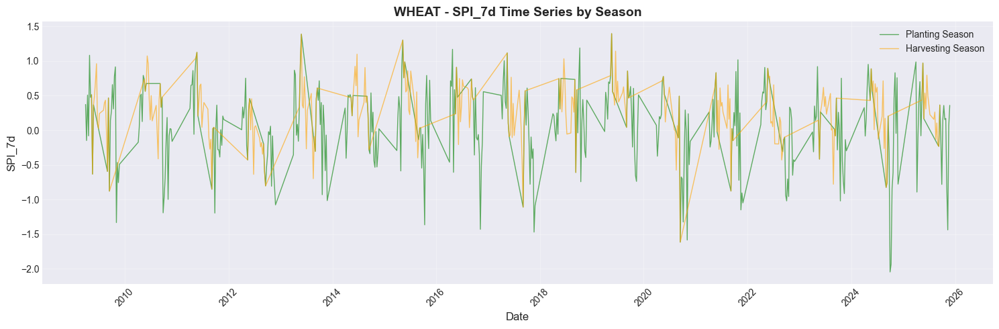

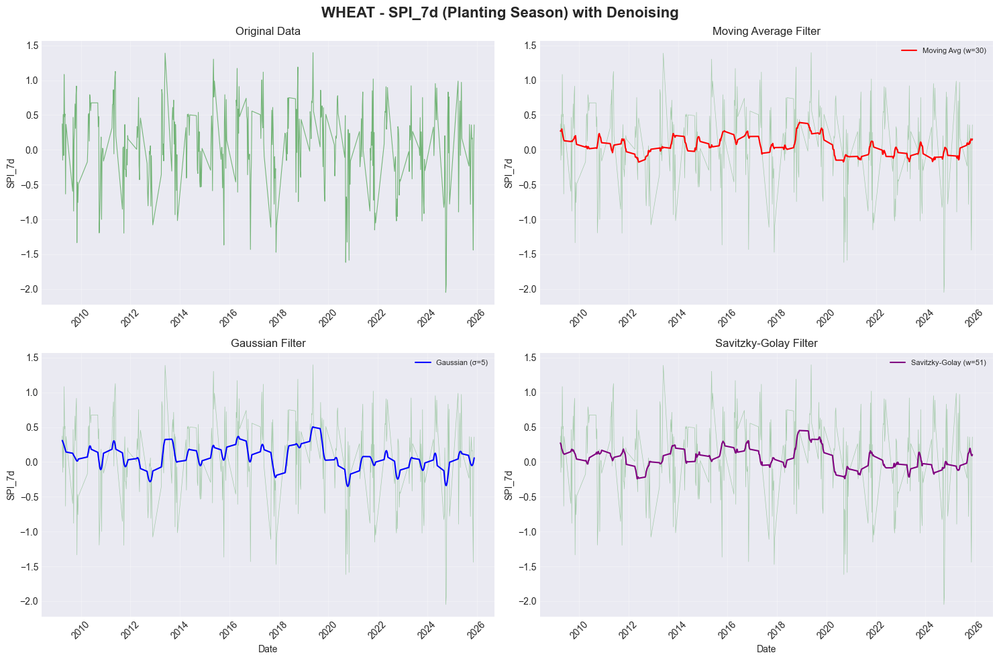

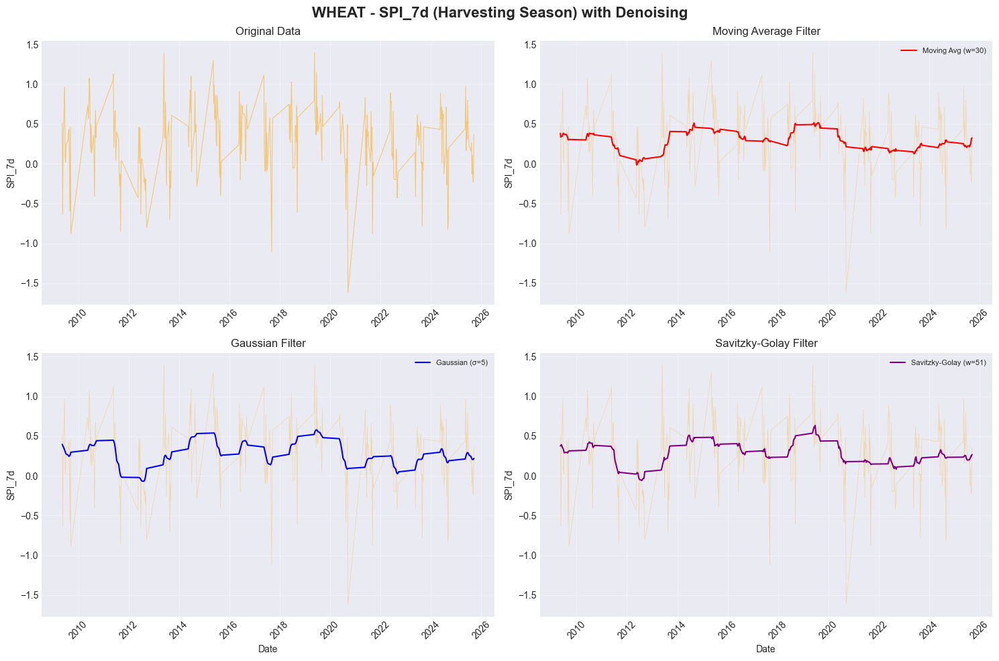

In [10]:
# Analyze each climate feature for wheat
for feature in CLIMATE_FEATURES:
    if feature in df_wheat.columns:
        analyze_feature_by_season(df_wheat, feature, 'wheat')

## Summary Statistics by Season

In [11]:
def get_season_summary(df, crop):
    """
    Generate summary statistics for planting and harvesting seasons.
    """
    df_planting = df[df['is_planting_week'] == 1]
    df_harvesting = df[df['is_harvesting_week'] == 1]
    
    summary = pd.DataFrame({
        'Crop': [crop] * len(CLIMATE_FEATURES) * 2,
        'Season': ['Planting'] * len(CLIMATE_FEATURES) + ['Harvesting'] * len(CLIMATE_FEATURES),
        'Feature': CLIMATE_FEATURES * 2,
    })
    
    means_planting = [df_planting[f].mean() if f in df_planting.columns else np.nan for f in CLIMATE_FEATURES]
    means_harvesting = [df_harvesting[f].mean() if f in df_harvesting.columns else np.nan for f in CLIMATE_FEATURES]
    
    stds_planting = [df_planting[f].std() if f in df_planting.columns else np.nan for f in CLIMATE_FEATURES]
    stds_harvesting = [df_harvesting[f].std() if f in df_harvesting.columns else np.nan for f in CLIMATE_FEATURES]
    
    summary['Mean'] = means_planting + means_harvesting
    summary['Std'] = stds_planting + stds_harvesting
    summary['Count'] = [len(df_planting)] * len(CLIMATE_FEATURES) + [len(df_harvesting)] * len(CLIMATE_FEATURES)
    
    return summary

# Generate summaries for all crops
summary_corn = get_season_summary(df_corn, 'Corn')
summary_soybean = get_season_summary(df_soybean, 'Soybean')
summary_wheat = get_season_summary(df_wheat, 'Wheat')

summary_all = pd.concat([summary_corn, summary_soybean, summary_wheat], ignore_index=True)

print("\n" + "="*80)
print("SUMMARY STATISTICS BY CROP AND SEASON")
print("="*80 + "\n")
print(summary_all.to_string(index=False))


SUMMARY STATISTICS BY CROP AND SEASON

   Crop     Season Feature      Mean      Std  Count
   Corn   Planting    TMAX 17.434068 6.053617    221
   Corn   Planting    TMIN  4.810730 5.729275    221
   Corn   Planting    AWND  4.289908 0.634059    221
   Corn   Planting  SPI_1m  0.166006 0.605246    221
   Corn   Planting  SPI_3m -0.329093 0.599314    221
   Corn   Planting  SPI_7d  0.243733 0.599320    221
   Corn Harvesting    TMAX 17.968763 7.089052    221
   Corn Harvesting    TMIN  5.407739 6.204328    221
   Corn Harvesting    AWND  3.597418 0.628432    221
   Corn Harvesting  SPI_1m -0.136804 0.663089    221
   Corn Harvesting  SPI_3m  0.207485 0.570062    221
   Corn Harvesting  SPI_7d -0.243568 0.819275    221
Soybean   Planting    TMAX 22.902659 5.322003    221
Soybean   Planting    TMIN 10.461438 5.459621    221
Soybean   Planting    AWND  3.857816 0.663667    221
Soybean   Planting  SPI_1m  0.519576 0.514334    221
Soybean   Planting  SPI_3m  0.186479 0.621869    221
Soybea

## Seasonal Comparison Across Crops


Cross-crop comparison for TMAX


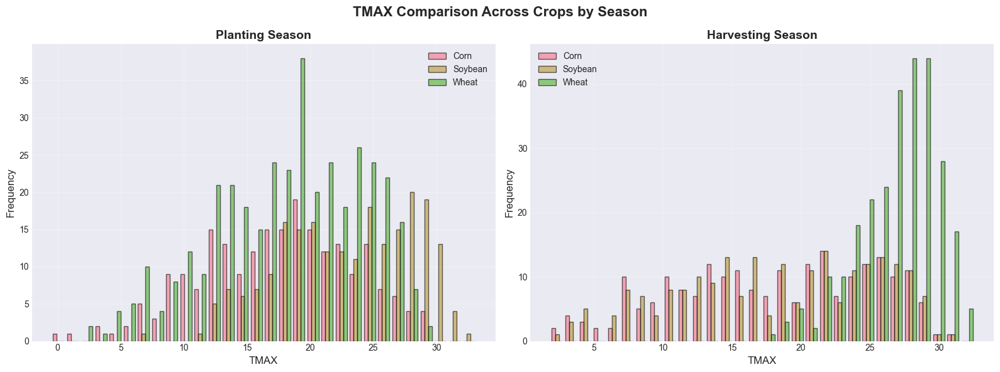


Cross-crop comparison for TMIN


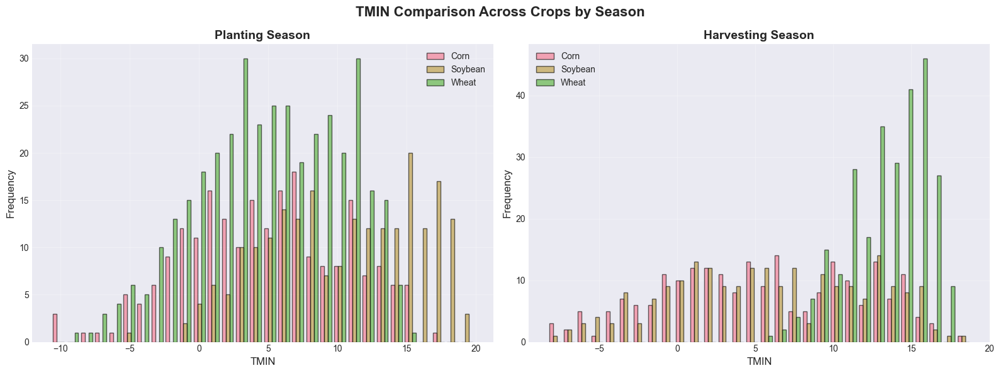


Cross-crop comparison for AWND


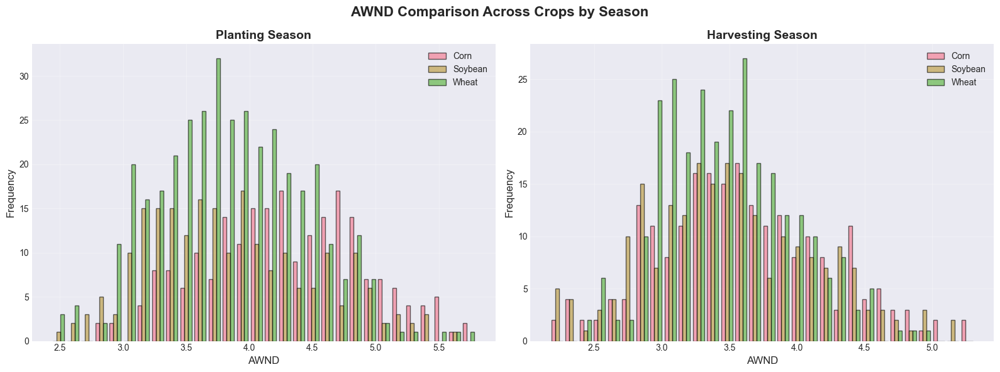


Cross-crop comparison for SPI_1m


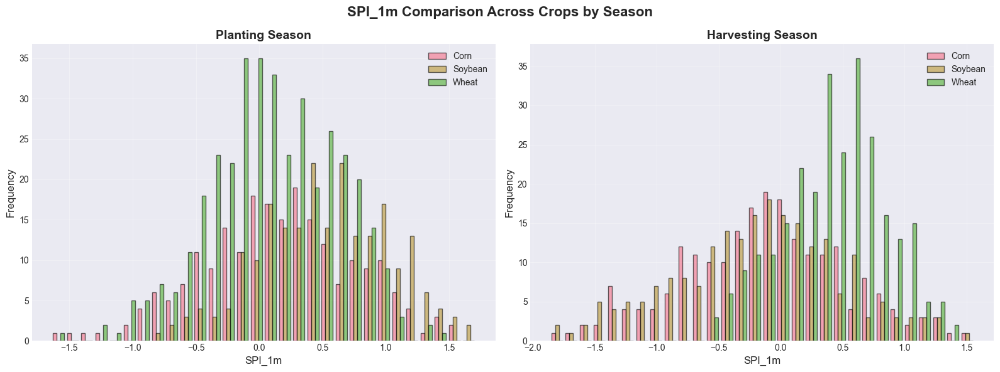


Cross-crop comparison for SPI_3m


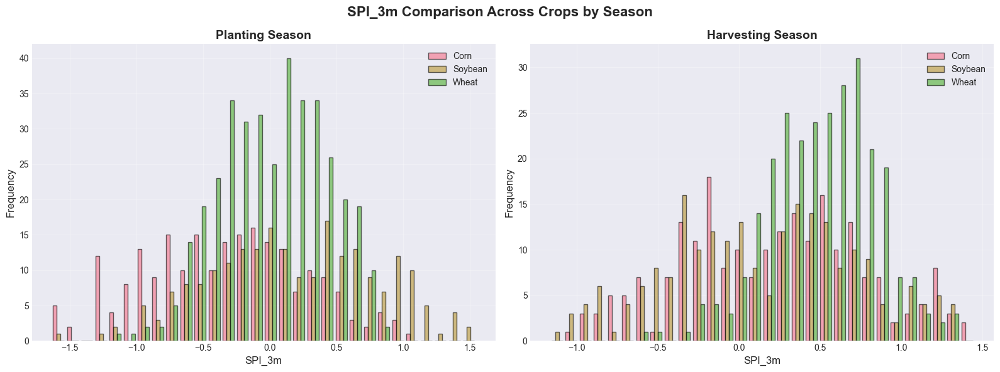


Cross-crop comparison for SPI_7d


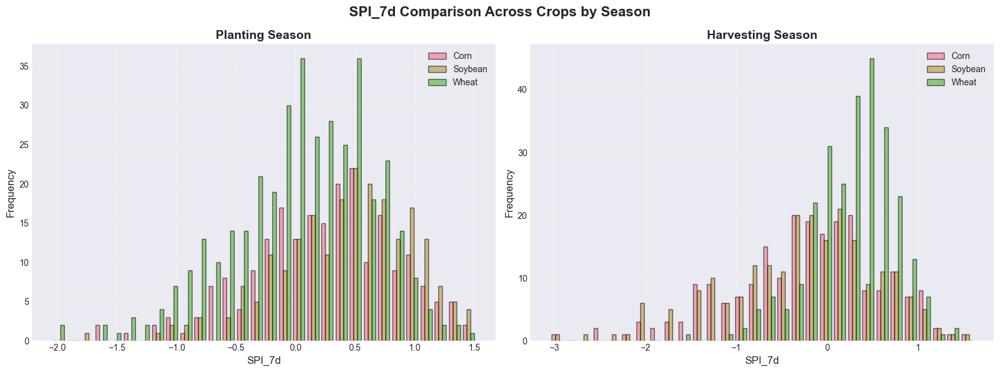

In [12]:
def plot_cross_crop_comparison(feature):
    """
    Compare a climate feature across all crops for planting and harvesting seasons.
    """
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f'{feature} Comparison Across Crops by Season', fontsize=16, fontweight='bold')
    
    # Planting season
    corn_planting = df_corn[df_corn['is_planting_week'] == 1][feature].dropna()
    soybean_planting = df_soybean[df_soybean['is_planting_week'] == 1][feature].dropna()
    wheat_planting = df_wheat[df_wheat['is_planting_week'] == 1][feature].dropna()
    
    axes[0].hist([corn_planting, soybean_planting, wheat_planting], bins=30, 
                 label=['Corn', 'Soybean', 'Wheat'], alpha=0.6, edgecolor='black')
    axes[0].set_xlabel(feature, fontsize=12)
    axes[0].set_ylabel('Frequency', fontsize=12)
    axes[0].set_title('Planting Season', fontsize=14, fontweight='bold')
    axes[0].legend(loc='best')
    axes[0].grid(True, alpha=0.3)
    
    # Harvesting season
    corn_harvesting = df_corn[df_corn['is_harvesting_week'] == 1][feature].dropna()
    soybean_harvesting = df_soybean[df_soybean['is_harvesting_week'] == 1][feature].dropna()
    wheat_harvesting = df_wheat[df_wheat['is_harvesting_week'] == 1][feature].dropna()
    
    axes[1].hist([corn_harvesting, soybean_harvesting, wheat_harvesting], bins=30,
                 label=['Corn', 'Soybean', 'Wheat'], alpha=0.6, edgecolor='black')
    axes[1].set_xlabel(feature, fontsize=12)
    axes[1].set_ylabel('Frequency', fontsize=12)
    axes[1].set_title('Harvesting Season', fontsize=14, fontweight='bold')
    axes[1].legend(loc='best')
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Plot cross-crop comparisons for each feature
for feature in CLIMATE_FEATURES:
    if feature in df_corn.columns:
        print(f"\nCross-crop comparison for {feature}")
        plot_cross_crop_comparison(feature)